In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
#import pandas as pd
import healpy as hp
import time
import warnings
import scipy.fftpack
import logging
#import pyshtools as pysh
import scipy.special as sp
from sympy.physics.quantum.cg import CG
from sympy import S

# Multipole expansion



a function $f(\theta,\varphi)$ can be expanded in series as a sum of spherical harmonics

$ f(\theta ,\varphi )=\sum _{\ell =0}^{\infty }\,\sum _{m=-\ell }^{\ell }\,C_{\ell }^{m}\,Y_{\ell }^{m}(\theta ,\varphi )$

It can also be expanded in Cartesian space 

$f(x,y,z) = C + \sum_{i=x,y,z} P_i\hat{n}^i +\frac{1}{2} \sum_{i,j=x,y,z} Q_{ij}\hat{n}^i\hat{n}^j+...$


where the $\hat{n}^i$ is a unit vector in the direction given by x,y,z.


C is the monopole, $P_i$ is dipole and  $Q_{ij}$ is quadrupole. 





$Q_{ij}$ is a  3 by 3 traceless symmetric matrix. So it has 5 free parameters. We use linear regression to fit for the monopole, dipole, and quadrupole.

functions:
    

In [2]:
#from . import _healpy_pixel_lib as pixlib

#: Special value used for masked pixels
UNSEEN = hp.pixelfunc.UNSEEN

In [3]:
def ma_to_array(m):
    """Converts a masked array or a list of masked arrays to filled numpy arrays
    Parameters
    ----------
    m : a map (may be a sequence of maps)
    Returns
    -------
    m : filled map or tuple of filled maps
    Examples
    --------
    >>> import healpy as hp
    >>> m = hp.ma(np.array([2., 2., 3, 4, 5, 0, 0, 0, 0, 0, 0, 0]))
    >>> m.mask = np.array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=np.bool_)
    >>> print(m.data[1]) # data is not affected by mask
    2.0
    >>> print(m[1]) # shows that the value is masked
    --
    >>> print(ma_to_array(m)[1]) # filled array, masked values replace by UNSEEN
    -1.6375e+30
    """

    try:
        return m.filled()
    except AttributeError:
        try:
            return np.array([mm.filled() for mm in m])
        except AttributeError:
            pass
    return m

In [4]:



def fit_dipole(m, nest=False, bad=UNSEEN, gal_cut=0):
    """Fit a dipole and a monopole to the map, excluding bad pixels.
    Parameters
    ----------
    m : float, array-like
      the map to which a dipole is fitted and subtracted, accepts masked maps
    nest : bool
      if ``False`` m is assumed in RING scheme, otherwise map is NESTED
    bad : float
      bad values of pixel, default to :const:`UNSEEN`.
    gal_cut : float [degrees]
      pixels at latitude in [-gal_cut;+gal_cut] degrees are not taken into account
    Returns
    -------
    res : tuple of length 2
      the monopole value in res[0] and the dipole vector (as array) in res[1]
    See Also
    --------
    remove_dipole, fit_monopole, remove_monopole
    """
    m = hp.pixelfunc.ma_to_array(m)
    m = np.asarray(m)
    npix = m.size
    nside = hp.npix2nside(npix)
    if nside > 128:
        bunchsize = npix // 24
    else:
        bunchsize = npix
    aa = np.zeros((4, 4), dtype=np.float64)
    v = np.zeros(4, dtype=np.float64)
    for ibunch in range(npix // bunchsize):
        ipix = np.arange(ibunch * bunchsize, (ibunch + 1) * bunchsize)
        ipix = ipix[(m.flat[ipix] != bad) & (np.isfinite(m.flat[ipix]))]
        x, y, z = hp.pix2vec(nside, ipix, nest)
        if gal_cut > 0:
            w = np.abs(z) >= np.sin(gal_cut * np.pi / 180)
            ipix = ipix[w]
            x = x[w]
            y = y[w]
            z = z[w]
            del w
        aa[0, 0] += ipix.size
        aa[1, 0] += x.sum()
        aa[2, 0] += y.sum()
        aa[3, 0] += z.sum()
        aa[1, 1] += (x ** 2).sum()
        aa[2, 1] += (x * y).sum()
        aa[3, 1] += (x * z).sum()
        aa[2, 2] += (y ** 2).sum()
        aa[3, 2] += (y * z).sum()
        aa[3, 3] += (z ** 2).sum()
        v[0] += m.flat[ipix].sum()
        v[1] += (m.flat[ipix] * x).sum()
        v[2] += (m.flat[ipix] * y).sum()
        v[3] += (m.flat[ipix] * z).sum()
    aa[0, 1] = aa[1, 0]
    aa[0, 2] = aa[2, 0]
    aa[0, 3] = aa[3, 0]
    aa[1, 2] = aa[2, 1]
    aa[1, 3] = aa[3, 1]
    aa[2, 3] = aa[3, 2]
    res = np.dot(np.linalg.inv(aa), v)
    mono = res[0]
    dipole = res[1:4]
    return mono, dipole


In [5]:
def fit_quadrupole(m, nest=False, bad=UNSEEN, gal_cut=0):
    """Fit a quadrupole, a dipole, and a monopole to the map, excluding bad pixels.
    Parameters
    ----------
    m : float, array-like
      the map to which a dipole is fitted and subtracted, accepts masked maps
    nest : bool
      if ``False`` m is assumed in RING scheme, otherwise map is NESTED
    bad : float
      bad values of pixel, default to :const:`UNSEEN`.
    gal_cut : float [degrees]
      pixels at latitude in [-gal_cut;+gal_cut] degrees are not taken into account
    Returns
    -------
    res : tuple of length 2
      the monopole value in res[0] and the dipole vector (as array) in res[1:4] and the quadrupole matrix values are in res[4:] 
    See Also
    --------
    remove_dipole, fit_monopole, remove_monopole
    """
    m = hp.pixelfunc.ma_to_array(m)
    m = np.asarray(m)
    npix = m.size
    nside = hp.npix2nside(npix)
    if nside > 128:
        bunchsize = npix // 24
    else:
        bunchsize = npix
    aa = np.zeros((9, 9), dtype=np.float64)
    v = np.zeros(9, dtype=np.float64)
    for ibunch in range(npix // bunchsize):
        ipix = np.arange(ibunch * bunchsize, (ibunch + 1) * bunchsize)
        ipix = ipix[(m.flat[ipix] != bad) & (np.isfinite(m.flat[ipix]))]
        x, y, z = hp.pix2vec(nside, ipix, nest)
        if gal_cut > 0:
            w = np.abs(z) >= np.sin(gal_cut * np.pi / 180)
            ipix = ipix[w]
            x = x[w]
            y = y[w]
            z = z[w]
            del w
        aa[0, 0] += ipix.size
        aa[1, 0] += x.sum()
        aa[2, 0] += y.sum()
        aa[3, 0] += z.sum()
        aa[4, 0] += (0.5*(x**2-z**2)).sum()
        aa[5, 0] += (0.5*2*x*y).sum()
        aa[6, 0] += (0.5*2*x*z).sum()
        aa[7, 0] += (0.5*(y**2-z**2)).sum()
        aa[8, 0] += (0.5*2*y*z).sum()
        aa[1, 1] += (x**2).sum()
        aa[2, 1] += (x*y).sum()
        aa[3, 1] += (x*z).sum()
        aa[4, 1] += (0.5*x*(x**2-z**2)).sum()
        aa[5, 1] += (0.5*2*y*x**2).sum()
        aa[6, 1] += (0.5*2*z*x**2).sum()
        aa[7, 1] += (0.5*x*(y**2-z**2)).sum()
        aa[8, 1] += (0.5*2*x*y*z).sum()
        aa[2, 2] += (y**2).sum()
        aa[3, 2] += (y*z).sum()
        aa[4, 2] += (0.5*y*(x**2-z**2)).sum()
        aa[5, 2] += (0.5*2*x*y**2).sum()
        aa[6, 2] += (0.5*2*x*y*z).sum()
        aa[7, 2] += (0.5*y*(y**2-z**2)).sum()
        aa[8, 2] += (0.5*2*z*y**2).sum()
        aa[3, 3] += (z ** 2).sum()
        aa[4, 3] += (0.5*z*(x**2-z**2)).sum()
        aa[5, 3] += (0.5*2*x*y*z).sum()
        aa[6, 3] += (0.5*2*x*z**2).sum()
        aa[7, 3] += (0.5*x*y*(y**2-z**2)).sum()
        aa[8, 3] += (0.5*2*y*z**2).sum()
        aa[4, 4] += (0.5**2*(x**2-z**2)**2).sum()
        aa[5, 4] += (0.5**2*2*y*x*(x**2-z**2)).sum()
        aa[6, 4] += (0.5**2*2*z*x*(x**2-z**2)).sum()
        aa[7, 4] += (0.5**2*(x**2-z**2)*(y**2-z**2)).sum()
        aa[8, 4] += (0.5**2*2*y*z*(x**2-z**2)).sum()
        aa[5, 5] += (0.5**2*4*x**2*y**2).sum()
        aa[6, 5] += (0.5**2*4*y*z*x**2).sum()
        aa[7, 5] += (0.5**2*2*x*y*(y**2-z**2)).sum()
        aa[8, 5] += (0.5**2*4*x*z*y**2).sum()
        aa[6, 6] += (0.5**2*4*x**2*z**2).sum()
        aa[7, 6] += (0.5**2*2*x*z*(y**2-z**2)).sum()
        aa[8, 6] += (0.5**2*4*x*y*z**2).sum()
        aa[7, 7] += (0.5**2*(y**2-z**2)**2).sum()
        aa[8, 7] += (0.5**2*2*z*y*(y**2-z**2)).sum()
        aa[8, 8] += (0.5**2*4*y**2*z**2).sum()

        v[0] += m.flat[ipix].sum()
        v[1] += (m.flat[ipix] * x).sum()
        v[2] += (m.flat[ipix] * y).sum()
        v[3] += (m.flat[ipix] * z).sum()
        v[4] += (m.flat[ipix] * 0.5*(x**2-z**2)).sum()
        v[5] += (m.flat[ipix] * 0.5*2*x*y).sum()
        v[6] += (m.flat[ipix] * 0.5*2*x*z).sum()
        v[7] += (m.flat[ipix] * 0.5*(y**2-z**2)).sum()
        v[8] += (m.flat[ipix] * 0.5*2*y*z).sum()
        
    aa[0, 1] = aa[1, 0]
    aa[0, 2] = aa[2, 0]
    aa[0, 3] = aa[3, 0]
    aa[0, 4] = aa[4, 0]
    aa[0, 5] = aa[5, 0]
    aa[0, 6] = aa[6, 0]
    aa[0, 7] = aa[7, 0]
    aa[0, 8] = aa[8, 0]
    aa[1, 2] = aa[2, 1]
    aa[1, 3] = aa[3, 1]
    aa[1, 4] = aa[4, 1]
    aa[1, 5] = aa[5, 1]
    aa[1, 6] = aa[6, 1]
    aa[1, 7] = aa[7, 1]
    aa[1, 8] = aa[8, 1]
    aa[2, 3] = aa[3, 2]
    aa[2, 4] = aa[4, 2]
    aa[2, 5] = aa[5, 2]
    aa[2, 6] = aa[6, 2]
    aa[2, 7] = aa[7, 2]
    aa[2, 8] = aa[8, 2]
    aa[3, 4] = aa[4, 3]
    aa[3, 5] = aa[5, 3]
    aa[3, 6] = aa[6, 3]
    aa[3, 7] = aa[7, 3]
    aa[3, 8] = aa[8, 3]
    aa[4, 5] = aa[5, 4]
    aa[4, 6] = aa[6, 4]
    aa[4, 7] = aa[7, 4]
    aa[4, 8] = aa[8, 4]
    aa[5, 6] = aa[6, 5]
    aa[5, 7] = aa[7, 5]
    aa[5, 8] = aa[8, 5]
    aa[6, 7] = aa[7, 6]
    aa[6, 8] = aa[8, 6]
    aa[7, 8] = aa[8, 7]
    
    res = np.dot(np.linalg.inv(aa), v)
    mono = res[0]
    dipole = res[1:4]
    quad = np.zeros ((3,3), dtype=np.float64)
    quad [0,0] = res[4]
    quad [1,0] = res[5]
    quad [2,0] = res[6]
    quad [0,1] = res[5]
    quad [0,2] = res[6]
    quad [1,1] = res[7]
    quad [2,1] = res[8]
    quad [1,2] = res[8]
    quad [2,2] = -res[4]-res[7]
    #quad /= 2
    return mono, dipole, quad



In [6]:
def fit_quadrupole_shortened(m, nest=False, bad=UNSEEN, gal_cut=0):
    """Fit a quadrupole, a dipole, and a monopole to the map, excluding bad pixels.
    Parameters
    ----------
    m : float, array-like
      the map to which a dipole is fitted and subtracted, accepts masked maps
    nest : bool
      if ``False`` m is assumed in RING scheme, otherwise map is NESTED
    bad : float
      bad values of pixel, default to :const:`UNSEEN`.
    gal_cut : float [degrees]
      pixels at latitude in [-gal_cut;+gal_cut] degrees are not taken into account
    Returns
    -------
    res : tuple of length 2
      the monopole value in res[0] and the dipole vector (as array) in res[1:4] and the quadrupole matrix values are in res[4:] 
    See Also
    --------
    remove_dipole, fit_monopole, remove_monopole
    """
    m = hp.pixelfunc.ma_to_array(m)
    m = np.asarray(m)
    npix = m.size
    nside = hp.npix2nside(npix)
    ipix = np.arange (0,npix)
    ipix = ipix[(m.flat[ipix] != bad) & (np.isfinite(m.flat[ipix]))]
    x, y, z = hp.pix2vec(nside, ipix, nest)
    if gal_cut > 0:
        w = np.abs(z) >= np.sin(gal_cut * np.pi / 180)
        ipix = ipix[w]
        x = x[w]
        y = y[w]
        z = z[w]

        del w

            
    X = np.vstack((np.ones(x.size), x, y, z, 0.5*(x**2-z**2), 0.5*2*x*y, 0.5*2*x*z, 0.5*(y**2-z**2), 0.5*2*y*z)).T
    Y = m[ipix]
    
    res = np.linalg.inv(X.T @ X) @ X.T @ Y

    mono = res[0]
    dipole = res[1:4]
    quad = np.zeros ((3,3), dtype=np.float64)
    quad [0,0] = res[4] 
    quad [1,0] = res[5]
    quad [2,0] = res[6]
    quad [0,1] = res[5]
    quad [0,2] = res[6]
    quad [1,1] = res[7]
    quad [2,1] = res[8]
    quad [1,2] = res[8]
    quad [2,2] = -res[4]-res[7]
    return mono, dipole, quad



In [7]:
def remove_quadrupole (m, quad_arr, nest=False, bad=UNSEEN, gal_cut=0):
    m = hp.pixelfunc.ma_to_array(m)
    m = np.asarray(m)
    npix = m.size
    nside = hp.npix2nside(npix)
    ipix = np.arange (0,npix)
    ipix = ipix[(m.flat[ipix] != bad) & (np.isfinite(m.flat[ipix]))]
    x, y, z = hp.pix2vec(nside, ipix, nest)
    quad = quad_arr[2]
    m1 = m-np.ones(npix)*0.5*(quad[0,0]*x**2+2*quad[0,1]*x*y+2*quad[0,2]*x*z+quad[1,1]*y**2+2*quad[1,2]*y*z+quad[2,2]*z**2)
    
    return m1

In [8]:
def alm2dipole (alm, lmax):
        
    mono = np.sqrt(1/4/np.pi) * alm[0]
    
    alm10 = alm[hp.Alm.getidx(lmax, 1,0)]
    alm11 = alm[hp.Alm.getidx(lmax, 1,1)]
    alm11d = np.conj(alm11)
    pz = np.sqrt (3/4/np.pi)* alm10
    px = -np.sqrt (3/8/np.pi)* (alm11+alm11d)
    py = -1.j*np.sqrt (3/8/np.pi)* (alm11-alm11d)
    p = np.array ([px,py,pz])
    return mono, p

In [9]:
def dipole2alm (dip, lmax):
    alm = np.zeros (hp.Alm.getsize(lmax), dtype = np.complex128)
    alm[0] = np.sqrt(4*np.pi)*dip[0]
    dipole = dip [1]
    alm10 = np.sqrt (4*np.pi/3) * dipole[2]
    alm11 = -np.sqrt (2*np.pi/3) *(dipole[0]-1.j*dipole[1])
    alm[hp.Alm.getidx(lmax, 1,0)] = alm10
    alm[hp.Alm.getidx(lmax, 1,1)] = alm11
    
    return alm
    

In [10]:
def alm2quad (alm, lmax):
    
    mono = np.sqrt(1/4/np.pi) * alm[0]
    
    alm10 = alm[hp.Alm.getidx(lmax, 1,0)]
    alm11 = alm[hp.Alm.getidx(lmax, 1,1)]
    alm11d = np.conj(alm11)
    pz = np.sqrt (3/4/np.pi)* alm10
    px = -np.sqrt (3/8/np.pi)* (alm11+alm11d)
    py = -1.j*np.sqrt (3/8/np.pi)* (alm11-alm11d)
    p = np.array ([px,py,pz])
    alm20 = alm[hp.Alm.getidx(lmax, 2,0)]
    alm21 = alm[hp.Alm.getidx(lmax, 2,1)]
    alm22 = alm[hp.Alm.getidx(lmax, 2,2)]
    alm21d = np.conj(alm21)
    alm22d = np.conj(alm22)
    
    Q = np.zeros ((3,3) , dtype = np.complex128)
    Q[2,2] = np.sqrt (5/np.pi) * alm20
    Q[0,2] = -np.sqrt (15/8/np.pi) * (alm21+alm21d)
    Q[1,2] = -1.j*np.sqrt (15/8/np.pi) * (alm21-alm21d)
    Q[0,1] = 1.j*np.sqrt (15/np.pi/8) * (alm22-alm22d)
    Q[0,0] = (np.sqrt (15/np.pi/8) * (alm22+alm22d) - Q[2,2]/2)
    Q[1,0] = Q[0,1]
    Q[2,0] = Q[0,2]
    Q[2,1] = Q[1,2]
    Q[1,1] = -Q[0,0] - Q[2,2]
    

    quad = [mono, p, Q]
    
    return quad

In [11]:
def quad2alm (quad, lmax):
    
    """gives alm equivalant to given monopole, dipole, and quadrupole
    Parameters
    ----------
    quad : array
      an array of size 3 consisting of monopole, dipole vector, and quadrupole matrix
    lmax: int
        maximum l. 
  
    -------
    alm : array
        the alm array 

    """
    
    alm = np.zeros (hp.Alm.getsize(lmax), dtype = np.complex128)
    alm[0] = np.sqrt(4*np.pi)*quad[0]
    dipole = quad [1]
    alm10 = np.sqrt (4*np.pi/3) * dipole[2]
    alm11 = -np.sqrt (2*np.pi/3) *(dipole[0]-1.j*dipole[1])
    alm[hp.Alm.getidx(lmax, 1,0)] = alm10
    alm[hp.Alm.getidx(lmax, 1,1)] = alm11
    Q = quad[2]
    alm20 = np.sqrt (np.pi/5) * Q[2,2]
    alm21 = -np.sqrt (2*np.pi/15) *(Q[0,2]-1.j*Q[1,2])
    alm22 = np.sqrt (np.pi/30)*(2*Q[0,0]-2.j*Q[0,1]+Q[2,2])
    alm[hp.Alm.getidx(lmax, 2,0)] = alm20
    alm[hp.Alm.getidx(lmax, 2,1)] = alm21
    alm[hp.Alm.getidx(lmax, 2,2)] = alm22
    
    return alm 
    
    
    

In [12]:
def make_dipole ( dipole, nside, nest=False):
    npix = hp.nside2npix(nside)
    ipix = np.arange (0,npix)
    x , y, z = hp.pix2vec(nside, ipix, nest)
    fac = dipole[0]*x+dipole[1]*y+dipole[2]*z
    m1 = np.ones(npix)*fac
    
    return m1     

In [13]:
def make_quad (quad, nside, nest= False ):
    npix = hp.nside2npix(nside)
    ipix = np.arange (0,npix)
    x , y, z = hp.pix2vec(nside, ipix, nest)
    fac = quad[0,0]*x**2+2*quad[0,1]*x*y+2*quad[0,2]*x*z+quad[1,1]*y**2+2*quad[1,2]*y*z+quad[2,2]*z**2
    m1 = np.ones(npix)*fac/2
    
    return m1

# Directly fitting alm

In [14]:
def fit_alm (ma, lmax_fit, nest=False, bad=UNSEEN, gal_cut=0):
    
    ma = hp.pixelfunc.ma_to_array(ma)
    ma = np.asarray(ma)
    npix = ma.size
    nside = hp.npix2nside(npix)
    ipix = np.arange (0,npix)
    ipix = ipix[(ma.flat[ipix] != bad) & (np.isfinite(ma.flat[ipix]))]
    
    theta, phi = hp.pix2ang(nside, ipix, nest)
    if gal_cut > 0:
        w = np.abs(theta-np.pi/2) >= gal_cut*np.pi/180 
        ipix = ipix[w]
        theta = theta[w]
        phi = phi[w]
        del w
    
    X = np.zeros ((ipix.shape[0], int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1), dtype = np.complex128)
    #X = np.zeros ((npix, (lmax_fit+1)**2))
    for l in range (lmax_fit+1):
        X[:,l] = sp.sph_harm(0, l, phi, theta )
    
    for l in range (lmax_fit+1):
        for m in range (1,l+1):
            k = (int(lmax_fit*(lmax_fit+1)/2)+lmax_fit)-(int((lmax_fit-m)*(lmax_fit-m+1)/2)+lmax_fit-m) +(l-m)
            X[:, k] = sp.sph_harm(m, l, phi, theta)
            #print (m,l)
            #print (k)
            #print (X[0,k])
    #X[:,0:lmax_fit+1] = np.real(X_tmp[:,0:lmax_fit+1])     
    #X[:,int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1:] = -2*np.imag (X_tmp[:,lmax_fit+1:int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1])
    #X[:,lmax_fit+1:int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1] = 2*np.real(X_tmp[:,lmax_fit+1:int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1])
    #print (X[:])
    #print (ipix)
    #print (m)
    Y = ma[ipix]
    X_star = X.conj().T
    alm = np.linalg.inv(X_star @ X) @ X_star @ Y
    #alm = np.zeros(int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1 , dtype = np.complex128) 
    #alm[0:lmax_fit+1] = res[0:lmax_fit+1]
    #alm[lmax_fit+1:] = res[lmax_fit+1:int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1]+1.j*res[int(lmax_fit*(lmax_fit+1)/2)+lmax_fit+1:]
    #print (res)
    
    return alm

    

# simulating quasar maps

In [15]:
import random 
def point_picking_old(weighting: np.ndarray, points: int):
    """
    Distributes points according to weighting in a an array.
    Does not support multithreading.
    """
    bins = range(len(weighting))
    #print(list(bins))
    dist = rand.choices(list(bins), weighting, k=points)
    #print(dist)
    #print(dist.count(4))
    hist = np.zeros(len(weighting), dtype=np.float64)
    for i in range (len(hist)):
        hist[i] = dist.count(i)
    return hist

In [16]:
def calc_D (dipole):
    mono = dipole[0]
    dip = dipole[1] 
    dmag = np.sqrt (dip[0]**2+dip[1]**2+dip[2]**2)
    return dmag/mono

In [17]:
def ang2quad (mag, theta, phi):
    x = mag* np.sin(theta)*np.cos(phi)
    y = mag* np.sin(theta)*np.sin(phi)
    z = mag* np.cos(theta)
    
    Q = np.zeros ((3,3))
    
    Q[0,0] = x**2
    Q[0,1] = x*y
    Q[0,2] = x*z
    
    Q[1,0] = Q[0,1]
    Q[1,1] = y**2
    Q[1,2] = y*z
    
    Q[2,0] = Q[0,2]
    Q[2,1] = Q[1,2]
    Q[2,2] = z**2
    
    return Q

    
    

In [18]:
def ang2dipole (mag, theta, phi):
    x = mag* np.sin(theta)*np.cos(phi)
    y = mag* np.sin(theta)*np.sin(phi)
    z = mag* np.cos(theta)
    
    return [x,y,z]

In [31]:
def Q_mat (lmax):
    almsize = hp.Alm.getsize(lmax)
    #almsize_big = hp.Alm.getsize(lmax+lmax)
    Q = np.zeros ((almsize,almsize,almsize),dtype = np.complex128)
    for i in range (almsize): 
        print (i)
        for j in range (i,almsize):
        #print (I)
        #L,M = hp.Alm.getlm(lmax,I)
            l1,m1 = hp.Alm.getlm(lmax,i)
            l2,m2 = hp.Alm.getlm(lmax,j)
            #print (l1, m1,l2, m2)
            for L in range (np.abs (l1-l2),int(min(l1+l2,lmax)+1)):
                if (m1+m2<=L):

                    M = m1+m2
                    #print (l1, m1,l2, m2,L,M)
                    I = hp.Alm.getidx(lmax, L, M)
                    fac = np.sqrt ((2*l1+1)*(2*l2+1)/(4*np.pi)/(2*L+1))
                    Q[I,i,j] = fac*CG(l1,0,l2,0,L,0).doit()*CG(l1,m1,l2,m2,L,M).doit()
                    Q[I,j,i] = Q[I,i,j]
                    
    return Q

In [32]:
nside = 64
lmax = 3* nside -1 
res_rad = hp.nside2resol(nside , arcmin = False)
res_arcmin = hp.nside2resol (nside, arcmin= True)
ell=np.arange(0,lmax+1)
mapsize = hp.nside2npix(nside)
almsize = hp.Alm.getsize(lmax)

# A monopole map

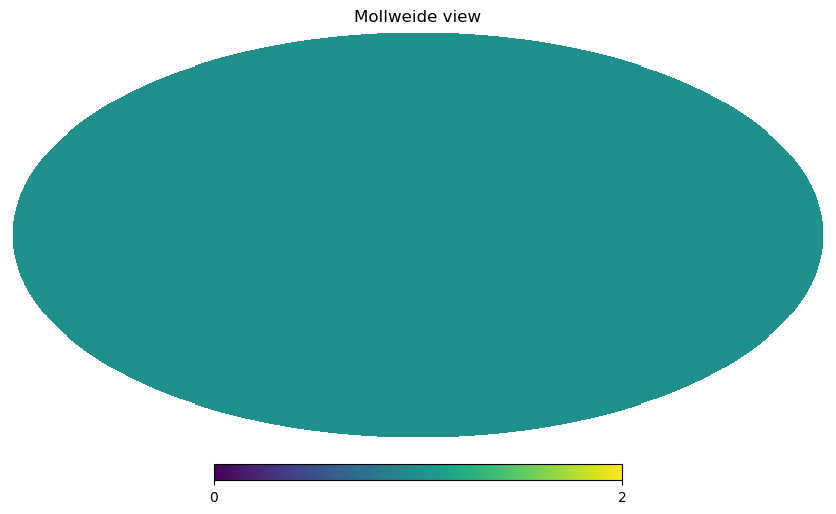

In [648]:
test_map = np.zeros (mapsize)
test_map[:] = 1
hp.mollview(test_map)


In [649]:
hp.pixelfunc.fit_dipole (test_map)

(1.0, array([2.46519033e-32, 4.56263093e-34, 0.00000000e+00]))

In [650]:
fit_quadrupole_shortened (test_map)

(0.9999999999999756,
 array([ 8.67573496e-19, -1.03835651e-17, -1.44873805e-15]),
 array([[-1.96080673e-15, -2.82961944e-19, -3.53805662e-18],
        [-2.82961944e-19, -9.57377623e-16, -3.84595310e-18],
        [-3.53805662e-18, -3.84595310e-18,  2.91818436e-15]]))

In [651]:
fit_quadrupole(test_map)

(1.0,
 array([-2.46504257e-32, -1.18639855e-33,  4.70623545e-38]),
 array([[-3.91845123e-36, -3.86407361e-34,  1.35789609e-34],
        [-3.86407361e-34, -1.09711848e-35,  0.00000000e+00],
        [ 1.35789609e-34,  0.00000000e+00,  1.48896360e-35]]))

In [652]:
fit_alm(test_map, lmax_fit=2)

array([ 3.54490770e+00-4.62438302e-33j, -3.21791205e-15-1.97427803e-33j,
       -1.40640537e-14+4.34139451e-34j,  5.16160702e-19-3.94606180e-17j,
       -1.83928969e-17-4.23304715e-19j, -1.86799917e-17+4.67081760e-18j])

# A dipole map

The vector dip shows the direction of our dipole

In [653]:
dipole_arr = np.array([1,1,1])
dipole_map = make_dipole ( dipole_arr, nside, nest=False)


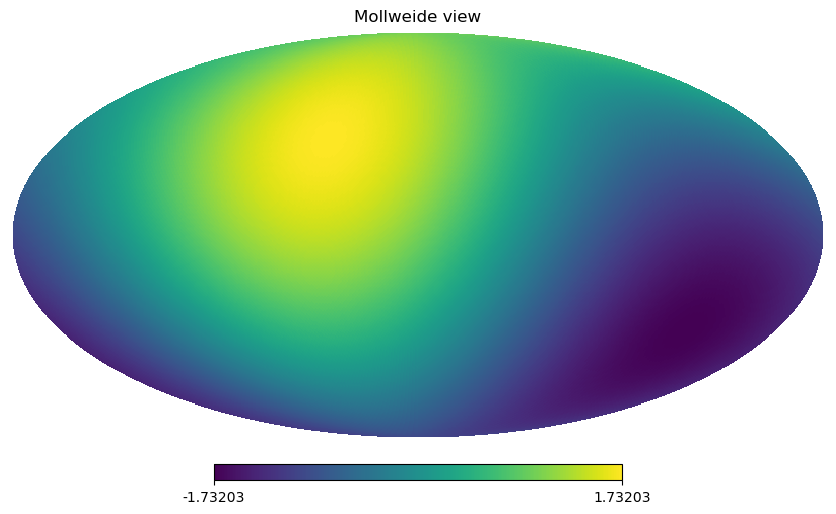

In [654]:
hp.mollview (dipole_map)

In [655]:
hp.fit_dipole(dipole_map)

(2.504507018441514e-17, array([1., 1., 1.]))

In [656]:
fit_quadrupole(dipole_map)

(2.5045411696380957e-17,
 array([1., 1., 1.]),
 array([[-2.63028517e-17,  8.38900141e-18, -1.45249895e-16],
        [ 8.38900141e-18, -3.41237839e-17,  1.12986592e-16],
        [-1.45249895e-16,  1.12986592e-16,  6.04266356e-17]]))

In [657]:
fit_quadrupole_shortened (dipole_map)

(-6.160387255447489e-17,
 array([1., 1., 1.]),
 array([[-2.25732866e-16, -1.48160454e-17, -5.71958998e-16],
        [-1.48160454e-17,  2.44065519e-16, -3.63015925e-16],
        [-5.71958998e-16, -3.63015925e-16, -1.83326528e-17]]))

# Quadrupole map

Q is the quadrupole matrix. It should be a real, traceless, symmetric matrix. 

In [658]:
Q = np.array([[0,2,1],[2,1,0],[1,0,-1]])

In [659]:
quad_map = make_quad (Q, nside, nest=False)

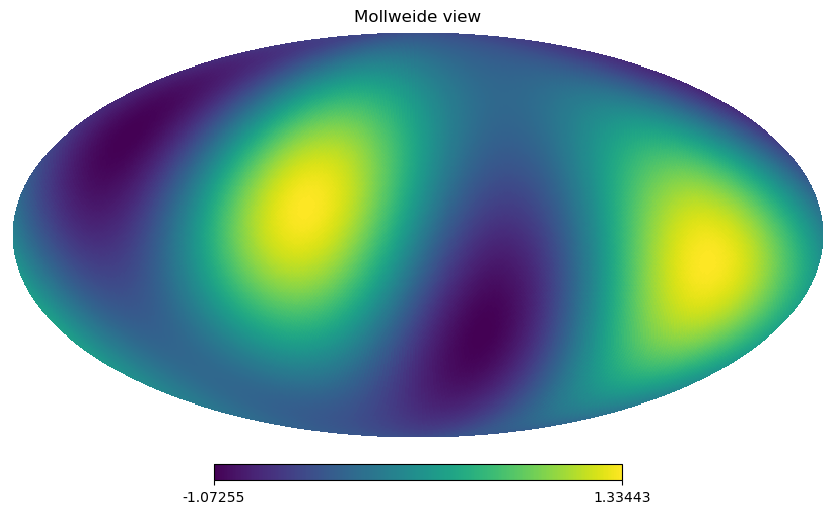

In [660]:
hp.mollview(quad_map)

In [661]:
%time
fit_quadrupole(quad_map)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 26 µs


(8.92560968169219e-18,
 array([-1.24369368e-17, -2.30157426e-18,  2.12505220e-17]),
 array([[-1.11022302e-16,  2.00000000e+00,  1.00000000e+00],
        [ 2.00000000e+00,  1.00000000e+00,  4.61184903e-18],
        [ 1.00000000e+00,  4.61184903e-18, -1.00000000e+00]]))

In [662]:
%time
fit_quadrupole_shortened (quad_map)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.91 µs


(6.736685963573946e-17,
 array([-1.31492971e-16,  2.38238604e-17,  4.69061435e-17]),
 array([[ 2.95492089e-16,  2.00000000e+00,  1.00000000e+00],
        [ 2.00000000e+00,  1.00000000e+00,  9.67015164e-18],
        [ 1.00000000e+00,  9.67015164e-18, -1.00000000e+00]]))

In [663]:
hp.fit_dipole(quad_map)

(5.6516793039233324e-06,
 array([-2.77542637e-17,  1.71573594e-17, -1.38781015e-17]))

# Converting to spherical harmonic space

In [664]:
mono = 20
p = np.zeros(3)
p[0] = 2
p[1] = 10
p[2] = 4
Q = np.zeros ((3,3))
Q[0,2] = 13
Q[2,1] = 1
Q[2,0] = 13
Q[1,2] = 1
Q[0,1] = 3
Q[1,0] = 3
Q[0,0] = 2
Q[2,2] = -2
alm = quad2alm([mono,p,Q],lmax)

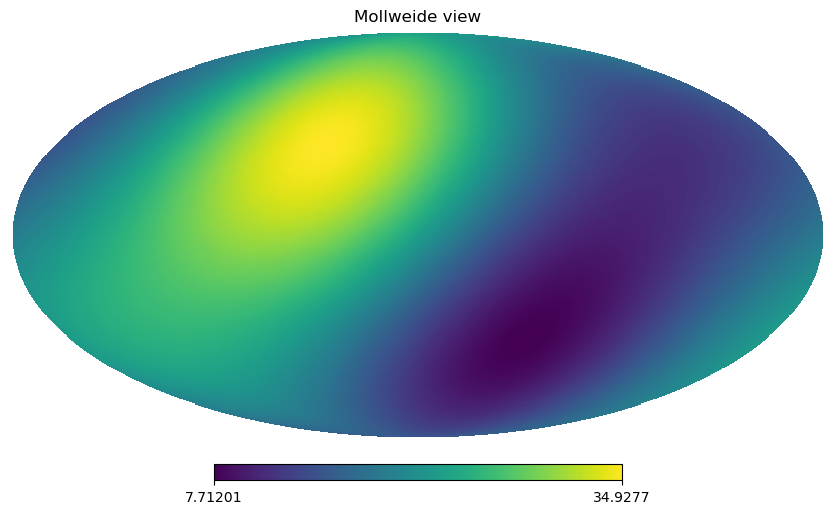

In [665]:
mapp = hp.alm2map(alm,nside)
hp.mollview(mapp)

In [666]:
hp.fit_dipole(mapp)

(20.000011303358605, array([ 2., 10.,  4.]))

In [667]:
fit_quadrupole(mapp)

(19.999999999999993,
 array([ 2., 10.,  4.]),
 array([[ 2.00000000e+00,  3.00000000e+00,  1.30000000e+01],
        [ 3.00000000e+00,  3.77602321e-15,  1.00000000e+00],
        [ 1.30000000e+01,  1.00000000e+00, -2.00000000e+00]]))

In [668]:
quaad = alm2quad(fit_alm(mapp,2),2)

In [669]:
quaad

[(20.000000000000107-3.4065611839136703e-16j),
 array([ 2.-0.00000000e+00j, 10.+0.00000000e+00j,  4.-2.94902874e-17j]),
 array([[ 2.00000000e+00-3.71685152e-16j,  3.00000000e+00+0.00000000e+00j,
          1.30000000e+01-0.00000000e+00j],
        [ 3.00000000e+00+0.00000000e+00j,  8.07132139e-12-3.71685152e-16j,
          1.00000000e+00+0.00000000e+00j],
        [ 1.30000000e+01-0.00000000e+00j,  1.00000000e+00+0.00000000e+00j,
         -2.00000000e+00+7.43370304e-16j]])]

# Mask

First we use a mask that covers all $\theta<\theta_0 $

In [670]:
theta , phi = hp.pix2ang(nside , np.arange (mapsize))


In [671]:
ids = np.where (np.abs(theta) < 30/180*np.pi )[0]


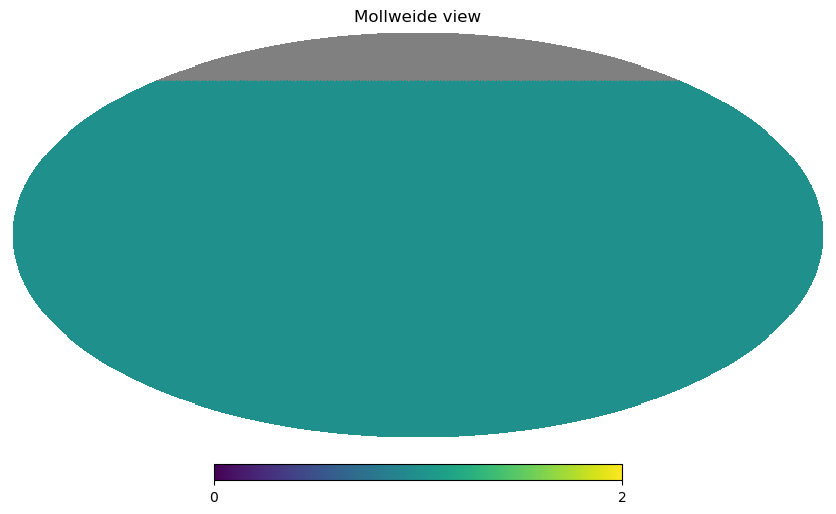

In [672]:
masked_pix = hp.ang2pix (nside, theta[ids] , phi[ids])
mask = np.ones (mapsize)
mask [masked_pix] = 0
masked_mono_map = hp.ma (test_map)
masked_mono_map.mask = np.logical_not(mask)
hp.mollview (masked_mono_map)

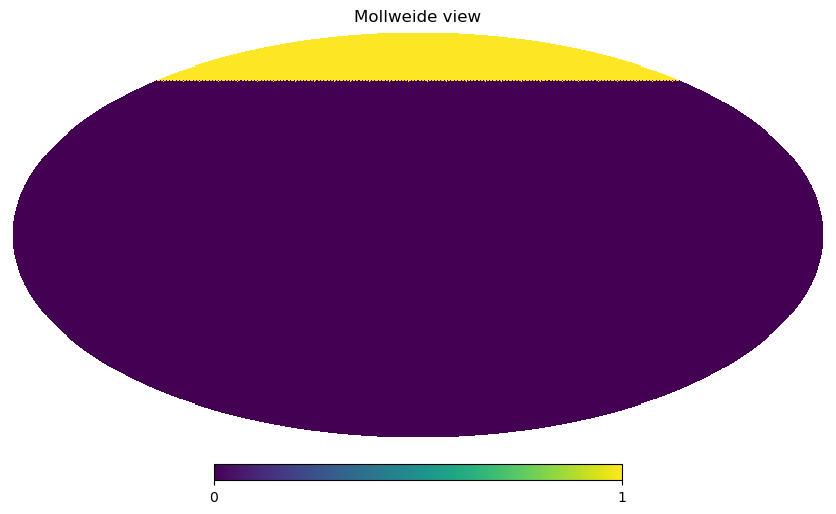

In [673]:
masked_pix = hp.ang2pix (nside, theta[ids] , phi[ids])
mask_map = np.zeros (mapsize)
mask_map [masked_pix] = 1
hp.mollview (mask_map)

In [674]:
hp.fit_dipole (masked_mono_map)

(0.9999999999999999,
 array([ 2.46519033e-32, -2.40741243e-34,  0.00000000e+00]))

In [675]:
fit_quadrupole(masked_mono_map)

(1.0,
 array([7.39565271e-32, 9.26853786e-34, 1.98179139e-36]),
 array([[ 5.55111512e-17, -2.82033645e-36, -6.14518196e-33],
        [-2.82033645e-36,  6.50511699e-36, -7.70371978e-34],
        [-6.14518196e-33, -7.70371978e-34, -5.55111512e-17]]))

In [676]:
hp.map2alm(masked_mono_map, lmax=lmax)

array([ 3.30832582e+00+0.00000000e+00j, -3.82421706e-01+0.00000000e+00j,
       -4.27827447e-01+0.00000000e+00j, ...,
        4.25296445e-44-9.77190051e-44j,  7.59333784e-43-1.06801738e-42j,
        5.65352542e-44+2.87531839e-43j])

In [677]:
hp.map2alm (test_map)

array([ 3.54490512e+00+0.00000000e+00j, -2.87705297e-17+0.00000000e+00j,
       -5.78181470e-06+0.00000000e+00j, ...,
        2.10425222e-44-1.01077326e-43j, -6.47529812e-52-8.67716028e-52j,
       -1.43915629e-44-5.18351461e-44j])

In [678]:
fit_alm(masked_mono_map, lmax_fit = 1)

array([3.54490770e+00-1.01111322e-33j, 6.66133815e-15-2.94908023e-34j,
       6.08237419e-17-4.11996826e-18j])

In [679]:
hp.map2alm (mask_map,1)

array([2.36557968e-01+0.00000000e+00j, 3.82397028e-01+0.00000000e+00j,
       1.63957053e-18-2.94550825e-19j])

In [680]:
fit_alm(mask_map, 1)

array([ 2.36557968e-01+4.81482486e-35j,  3.82397028e-01-2.16290961e-35j,
       -1.58835618e-17-1.73472348e-18j])

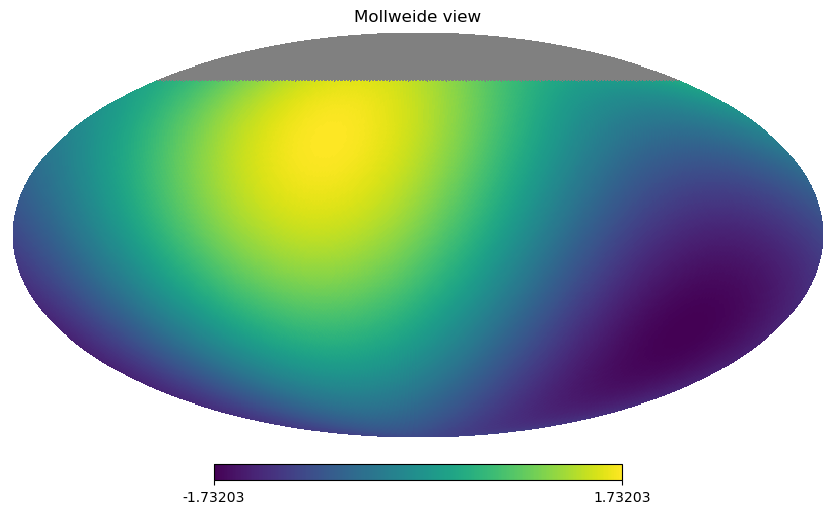

In [681]:
masked_dipole_map = hp.ma (dipole_map)
masked_dipole_map.mask = np.logical_not(mask)
hp.mollview (masked_dipole_map)

In [682]:
hp.fit_dipole(masked_dipole_map)

(-2.7755575615628914e-17, array([1., 1., 1.]))

In [683]:
fit_quadrupole(masked_dipole_map)

(-0.0081368754056418,
 array([1.        , 1.        , 1.01891607]),
 array([[-2.25528750e-01,  1.98345421e-17, -6.70017436e-18],
        [ 1.98345421e-17,  5.50549348e-01, -1.05575397e-16],
        [-6.70017436e-18, -1.05575397e-16, -3.25020599e-01]]))

In [684]:
fit_quadrupole(dipole_map)

(2.5045411696380957e-17,
 array([1., 1., 1.]),
 array([[-2.63028517e-17,  8.38900141e-18, -1.45249895e-16],
        [ 8.38900141e-18, -3.41237839e-17,  1.12986592e-16],
        [-1.45249895e-16,  1.12986592e-16,  6.04266356e-17]]))

In [685]:
hp.map2alm(dipole_map, 1)

array([-1.89008223e-16+0.j        ,  2.04665342e+00+0.j        ,
       -1.44720251e+00+1.44720251j])

In [686]:
hp.map2alm(masked_dipole_map, lmax=1)

array([-0.22077204+0.j        ,  1.68916695+0.j        ,
       -1.42872883+1.42872883j])

In [687]:
fit_alm(masked_dipole_map, 1)

array([ 1.11022302e-16-1.06922106e-16j,  2.04665342e+00-2.20613847e-17j,
       -1.44720251e+00+1.44720251e+00j])

# Another mask

This mask covers the equator.

In [688]:
ids = np.where (np.abs(theta-np.pi/2) < 30/180*np.pi )[0]



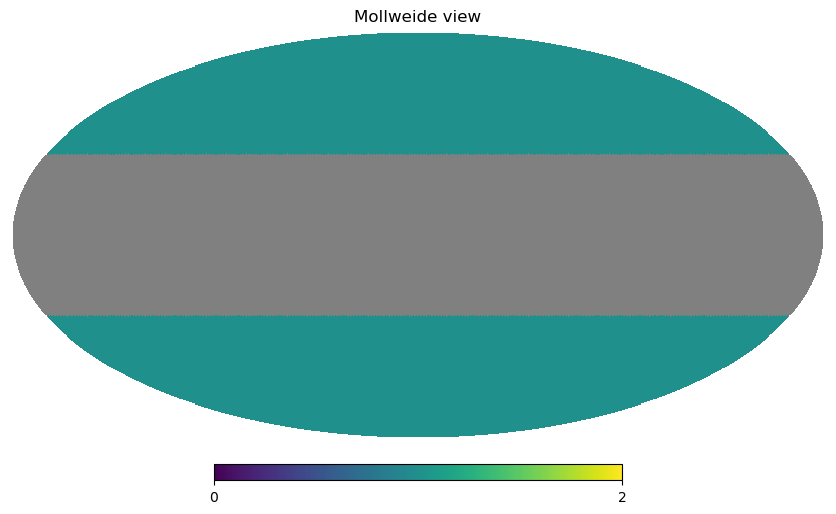

In [689]:
masked_pix = hp.ang2pix (nside, theta[ids] , phi[ids])
mask1 = np.ones (mapsize)
mask1 [masked_pix] = 0
masked_mono_map1 = hp.ma (test_map)
masked_mono_map1.mask = np.logical_not(mask1)
hp.mollview (masked_mono_map1)

In [690]:
hp.fit_dipole (masked_mono_map1)

(1.0, array([2.46519033e-32, 1.99098251e-33, 0.00000000e+00]))

In [691]:
%time
fit_quadrupole(masked_mono_map1)

CPU times: user 6 µs, sys: 2 µs, total: 8 µs
Wall time: 13.1 µs


(0.9999999999999999,
 array([-2.46478394e-32, -3.09814833e-33, -1.22388256e-35]),
 array([[-8.88178420e-16,  1.23213078e-32,  1.65291996e-35],
        [ 1.23213078e-32, -1.77635684e-15,  2.92500610e-33],
        [ 1.65291996e-35,  2.92500610e-33,  2.66453526e-15]]))

In [692]:
%time
fit_quadrupole_shortened(masked_mono_map1)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 9.06 µs


(1.0000000000000133,
 array([-1.28037500e-17, -1.87079932e-17,  7.03766472e-15]),
 array([[ 2.02523545e-15,  7.86514561e-17,  3.05334202e-17],
        [ 7.86514561e-17,  2.09467860e-15,  2.73591642e-19],
        [ 3.05334202e-17,  2.73591642e-19, -4.11991405e-15]]))

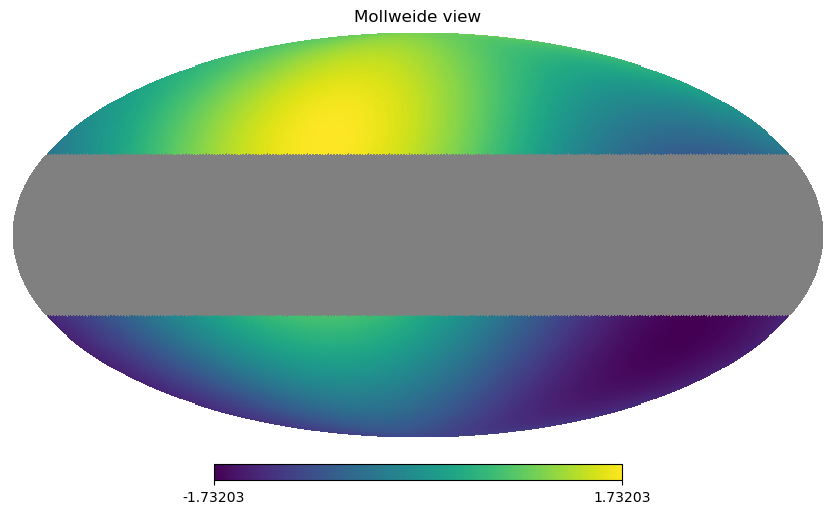

In [693]:
masked_dipole_map1 = hp.ma (dipole_map)
masked_dipole_map1.mask = np.logical_not(mask1)
hp.mollview (masked_dipole_map1)

In [694]:
hp.fit_dipole(masked_dipole_map1)

(-2.7169882895647063e-17, array([1., 1., 1.]))

In [695]:
quad2alm(fit_quadrupole(masked_dipole_map1), lmax)

array([-3.17509009e-16+0.j,  2.04665342e+00+0.j,  2.67501684e-16+0.j, ...,
        0.00000000e+00+0.j,  0.00000000e+00+0.j,  0.00000000e+00+0.j])

In [696]:
fit_alm(masked_dipole_map1, lmax_fit=2)

array([-3.98986399e-15-1.21467477e-16j,  2.04665342e+00+9.34803275e-19j,
        1.42941214e-15+6.33570601e-17j, -1.44720251e+00+1.44720251e+00j,
       -2.63190077e-16+3.73670279e-16j, -1.61422457e-16+1.80680598e-17j])

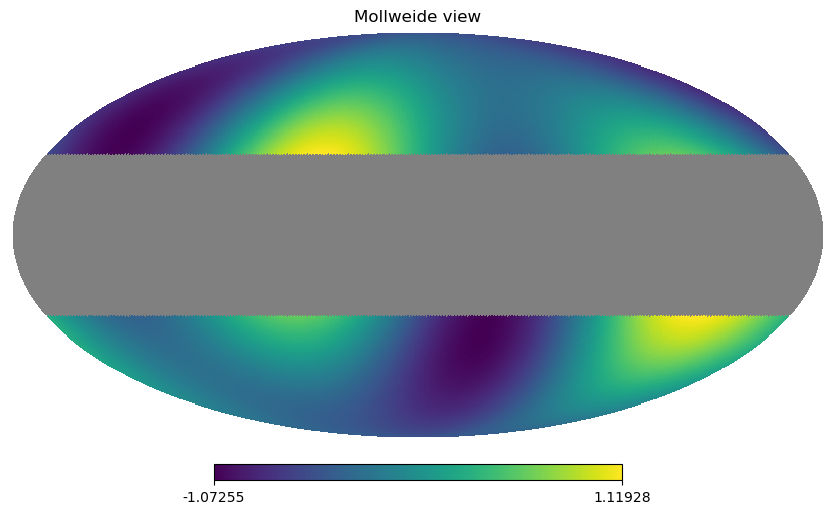

In [697]:
masked_quad_map1 = hp.ma (quad_map)
masked_quad_map1.mask = np.logical_not(mask1)
hp.mollview (masked_quad_map1)

In [698]:
%time
fit_quadrupole(masked_quad_map1)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 6.91 µs


(-5.551115123125783e-17,
 array([-1.52015886e-17,  2.00761267e-18, -1.66234465e-17]),
 array([[ 2.18330803e-35,  2.00000000e+00,  1.00000000e+00],
        [ 2.00000000e+00,  1.00000000e+00,  4.82650556e-18],
        [ 1.00000000e+00,  4.82650556e-18, -1.00000000e+00]]))

In [699]:
%time
quad2alm(fit_quadrupole_shortened(masked_quad_map1), lmax=3)

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 10 µs


array([-4.44054257e-16+0.00000000e+00j,  1.13612521e-16+0.00000000e+00j,
       -7.92665460e-01+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
       -3.18234809e-16+1.39057952e-17j, -6.47208638e-01-1.54423071e-19j,
        0.00000000e+00+0.00000000e+00j, -3.23604319e-01-1.29441728e+00j,
        0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j])

In [700]:
fit_alm(masked_quad_map1, 3)

array([ 1.39818712e-15-7.53748257e-17j,  1.33573708e-16-2.72622244e-18j,
       -7.92665460e-01+3.75785453e-17j,  3.19189120e-16+4.36775385e-18j,
       -2.97505076e-16+1.22447083e-16j, -6.47208638e-01+2.11080610e-17j,
       -2.48282297e-16-8.68412059e-17j, -3.23604319e-01-1.29441728e+00j,
       -7.14794164e-17+5.80044774e-16j, -7.26915205e-17+9.63802792e-17j])

In [701]:
hp.map2alm (masked_quad_map1, lmax= 3)

array([-3.31149454e-01+0.00000000e+00j, -2.51038309e-17+0.00000000e+00j,
       -4.89547572e-01+0.00000000e+00j,  4.36959932e-17+0.00000000e+00j,
       -1.33541242e-17-2.89769040e-17j, -4.80016394e-01+8.91513941e-17j,
        4.75759204e-18-2.75596538e-17j, -6.87840480e-02-2.75136192e-01j,
        1.46420280e-17+9.96625185e-18j,  3.65828869e-18+4.65864092e-17j])

In [702]:
fit_alm(quad_map, 3)

array([-3.40331062e-16-9.14170683e-17j, -4.49727061e-16+5.03208800e-19j,
       -7.92665460e-01+4.45529781e-17j, -3.61689845e-16-2.81359717e-19j,
       -8.29442191e-17+1.47232370e-16j, -6.47208638e-01+3.89805886e-18j,
       -1.06068007e-16+3.69505550e-18j, -3.23604319e-01-1.29441728e+00j,
       -1.38591798e-16+1.96419539e-17j, -4.63095413e-17+7.09242386e-17j])

# A monopole and a dipole plus a small quadrupole

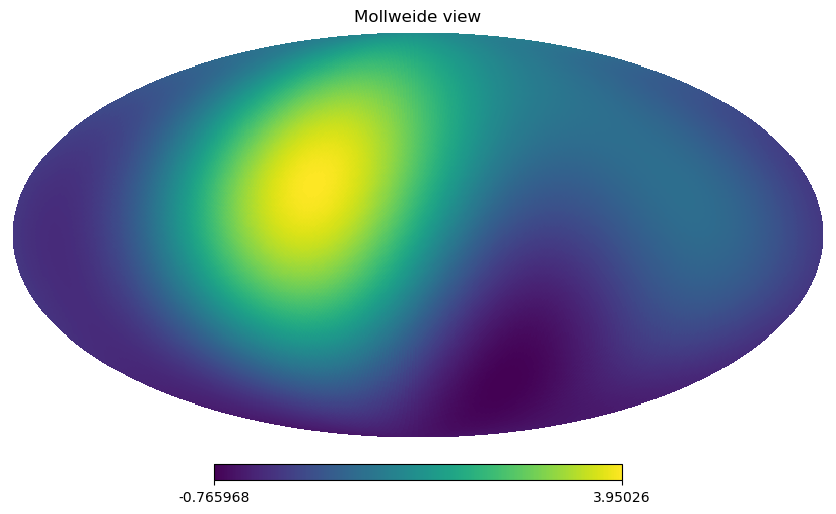

In [703]:
sum_map =  test_map+dipole_map + quad_map
hp.mollview (sum_map)

In [704]:
quad_sum = fit_quadrupole(sum_map)

In [705]:
fit_quadrupole_shortened (sum_map)

(0.9999999999999981,
 array([1., 1., 1.]),
 array([[ 1.30902340e-15,  2.00000000e+00,  1.00000000e+00],
        [ 2.00000000e+00,  1.00000000e+00,  2.12220027e-15],
        [ 1.00000000e+00,  2.12220027e-15, -1.00000000e+00]]))

In [706]:
alm2quad(fit_alm(sum_map, lmax_fit=5), lmax=5)

[(1.000000000000005-5.815952881946952e-17j),
 array([1.-0.00000000e+00j, 1.+0.00000000e+00j, 1.-3.16385023e-19j]),
 array([[ 4.03999056e-12-6.23371497e-17j,  2.00000000e+00+0.00000000e+00j,
          1.00000000e+00-0.00000000e+00j],
        [ 2.00000000e+00+0.00000000e+00j,  1.00000000e+00-6.23371497e-17j,
         -7.56325413e-18-0.00000000e+00j],
        [ 1.00000000e+00-0.00000000e+00j, -7.56325413e-18-0.00000000e+00j,
         -1.00000000e+00+1.24674299e-16j]])]

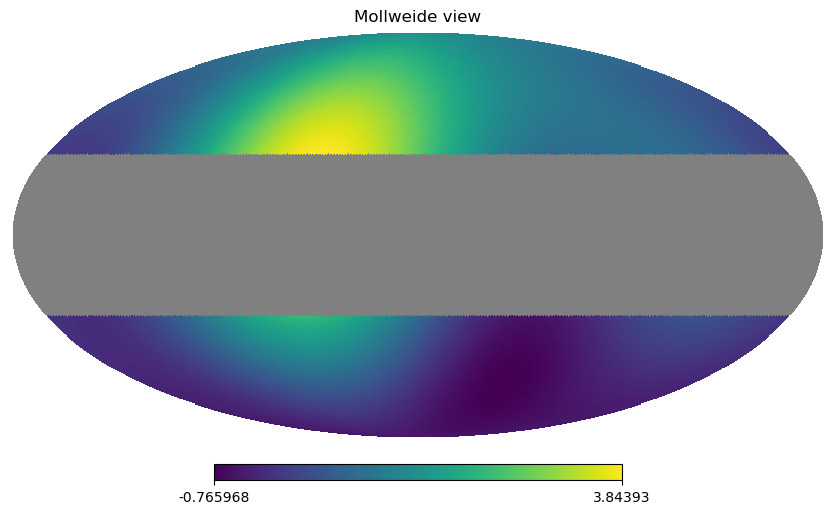

In [707]:
masked_sum_map1 = hp.ma (sum_map)
masked_sum_map1.mask = np.logical_not(mask1)
hp.mollview (masked_sum_map1)

# Quasar mask

64

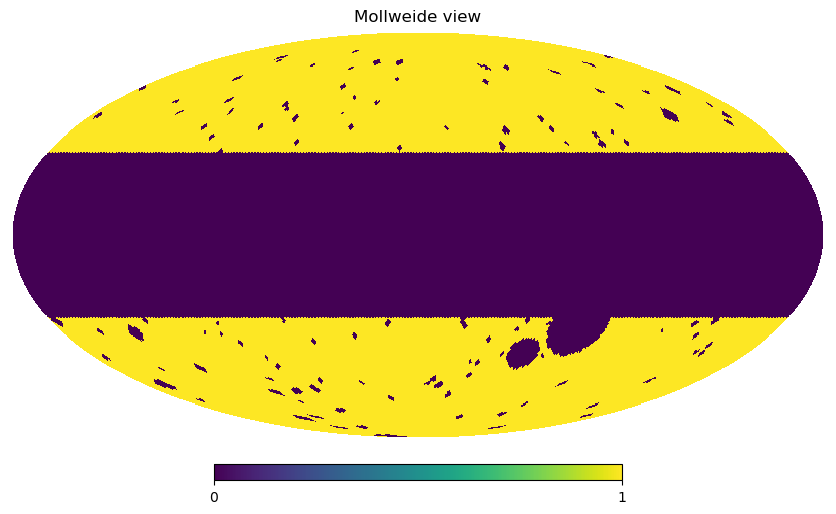

In [708]:
quasar_mask = hp.read_map('/Users/arefe/Downloads/quasar_mask.fits')
hp.mollview (quasar_mask)
hp.npix2nside(len(quasar_mask))


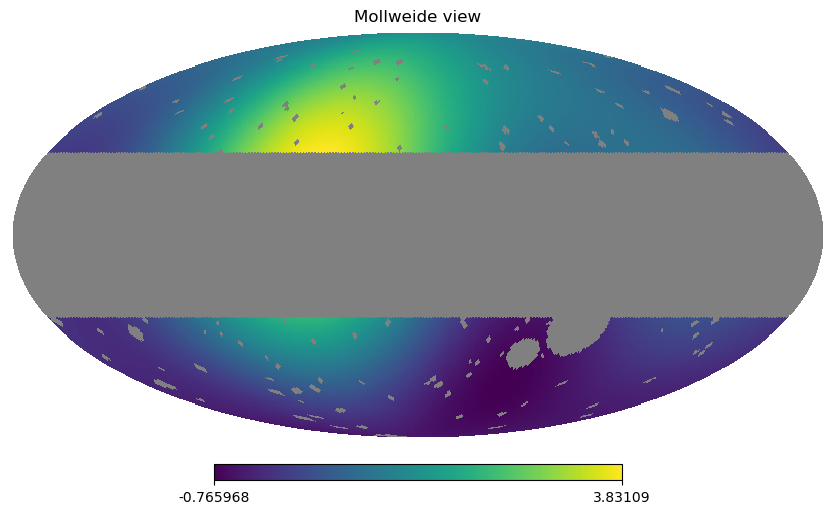

In [709]:
masked_map_sum1 = hp.ma (sum_map)
masked_map_sum1.mask = np.logical_not(quasar_mask)
hp.mollview (masked_map_sum1)

In [710]:
fit_quadrupole_shortened(masked_map_sum1)

(1.0000000000000016,
 array([1., 1., 1.]),
 array([[ 9.18583514e-16,  2.00000000e+00,  1.00000000e+00],
        [ 2.00000000e+00,  1.00000000e+00,  2.30453948e-16],
        [ 1.00000000e+00,  2.30453948e-16, -1.00000000e+00]]))

In [711]:
dip = hp.fit_dipole (masked_map_sum1)
dip

(0.8136779445127322, array([1.01427795, 0.98896357, 0.99404465]))

In [712]:
np.sqrt(dip[1][0]**2+dip[1][1]**2+dip[1][1]**2 )

1.7276740552242869

In [713]:
np.sqrt(3)/1

1.7320508075688772

# Generating a map using alm


In [714]:
alm_quad = np.zeros (hp.Alm.getsize(lmax), dtype = np.complex128)
alm_quad [:20] = 1+0.j
#alm_quad [1:12] = 1+0.j

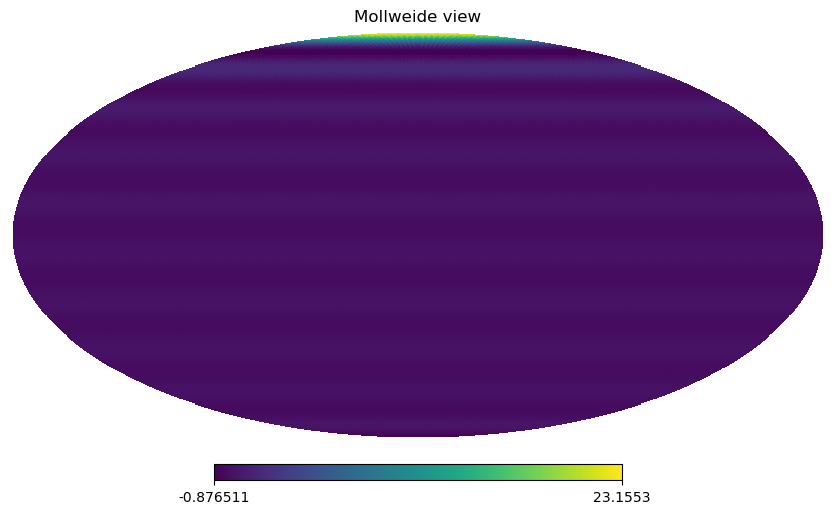

In [715]:
map_alm = hp.alm2map (alm_quad, nside)
hp.mollview (map_alm)

In [716]:
hp.map2alm(map_alm)

array([ 9.99970395e-01+0.00000000e+00j,  9.99941473e-01+0.00000000e+00j,
        9.99933815e-01+0.00000000e+00j, ...,
       -6.43117850e-21+1.70130213e-20j,  7.00366185e-20+7.07612330e-20j,
       -1.09114719e-20+2.65948099e-20j])

In [717]:
quad2alm(fit_quadrupole(map_alm),lmax)

array([0.99948187+0.j, 0.99899219+0.j, 0.99885773+0.j, ...,
       0.        +0.j, 0.        +0.j, 0.        +0.j])

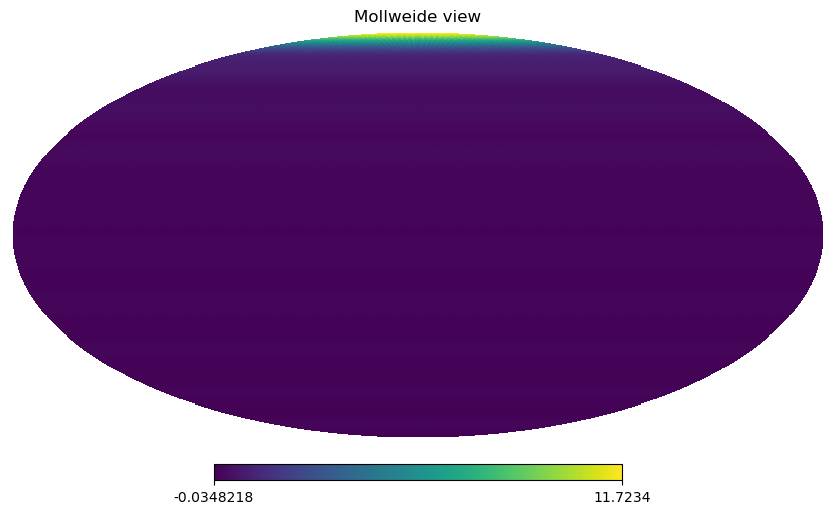

In [718]:
smoothed_map = hp.smoothing(map_alm, sigma=0.1)
hp.mollview (smoothed_map)

In [719]:
quad_arr = fit_quadrupole (map_alm)
alm_quad_out = quad2alm (quad_arr, lmax) 
quad_arr

(0.28194863053295155,
 array([-6.10483575e-19,  2.64716047e-18,  4.88110095e-01]),
 array([[-6.30062605e-01,  2.89490629e-18,  5.03692165e-17],
        [ 2.89490629e-18, -6.30062605e-01,  2.87542839e-18],
        [ 5.03692165e-17,  2.87542839e-18,  1.26012521e+00]]))

In [720]:
alm_quad_out

array([0.99948187+0.j, 0.99899219+0.j, 0.99885773+0.j, ...,
       0.        +0.j, 0.        +0.j, 0.        +0.j])

In [721]:
fitted = fit_alm(map_alm, lmax_fit=10)

In [722]:
fitted

array([ 9.99693128e-01-4.10953668e-26j,  9.99324732e-01+3.10242007e-26j,
        9.99323134e-01+6.65333700e-26j,  9.99016961e-01-1.33866429e-26j,
        9.99100802e-01+9.82365404e-26j,  9.98770696e-01-1.41972807e-26j,
        9.98911812e-01+1.39317212e-26j,  9.98522425e-01-3.24942592e-27j,
        9.98748510e-01-5.90574985e-26j,  9.98341626e-01-3.42995042e-26j,
        9.98617240e-01+4.43177249e-26j, -1.24641313e-17+9.70377536e-18j,
        5.94375699e-18-1.64780503e-17j,  2.67669185e-17+1.56403064e-17j,
       -1.01980222e-17-8.17088053e-19j,  1.96781004e-17-6.49157178e-18j,
       -1.17517348e-17+9.13712753e-18j,  8.01886206e-18+2.35619297e-18j,
       -1.51588409e-17+1.46481071e-18j, -8.78000483e-18+6.49671769e-18j,
       -4.85478653e-17-1.74455541e-18j, -1.69725426e-18+3.08669063e-18j,
       -6.03251775e-18-1.44326076e-17j,  6.68962836e-18+8.83365367e-18j,
        1.75828955e-18+5.85080067e-18j,  1.17260560e-17+1.14184276e-17j,
       -6.02426945e-18-1.29479574e-17j, -1.28650561

In [723]:
smoothed_fitted = fit_alm(smoothed_map, lmax_fit=20)

In [724]:
smoothed_fitted

array([ 9.99970398e-01+4.78954194e-25j,  9.89991898e-01+1.22120899e-25j,
        9.70381313e-01+3.56776626e-25j,  9.41680445e-01-3.36254241e-25j,
        9.04757119e-01+1.12565895e-24j,  8.60611694e-01+2.13784645e-25j,
        8.10497843e-01+1.62925245e-24j,  7.55685041e-01+3.78123591e-25j,
        6.97591348e-01+1.38878458e-24j,  6.37534530e-01+8.53911755e-25j,
        5.76871789e-01+1.69457104e-24j,  5.16767973e-01+3.02067672e-25j,
        4.58338465e-01+1.49238250e-24j,  4.02453982e-01+7.82313595e-26j,
        3.49882297e-01+1.61741829e-24j,  3.01137974e-01+1.13580650e-24j,
        2.56617466e-01+2.43935567e-24j,  2.16492800e-01+3.90556255e-25j,
        1.80833542e-01+1.65951171e-24j,  1.49537446e-01-4.18230891e-25j,
       -2.29287377e-05+2.08892404e-24j, -5.57517604e-18+9.10680608e-18j,
        1.05269994e-17-9.59643884e-18j,  2.46928674e-17+1.14961985e-17j,
        9.98201964e-19-1.78855453e-17j,  2.29977341e-17-8.46000539e-18j,
        2.23455931e-18+1.23048281e-17j,  1.16541791

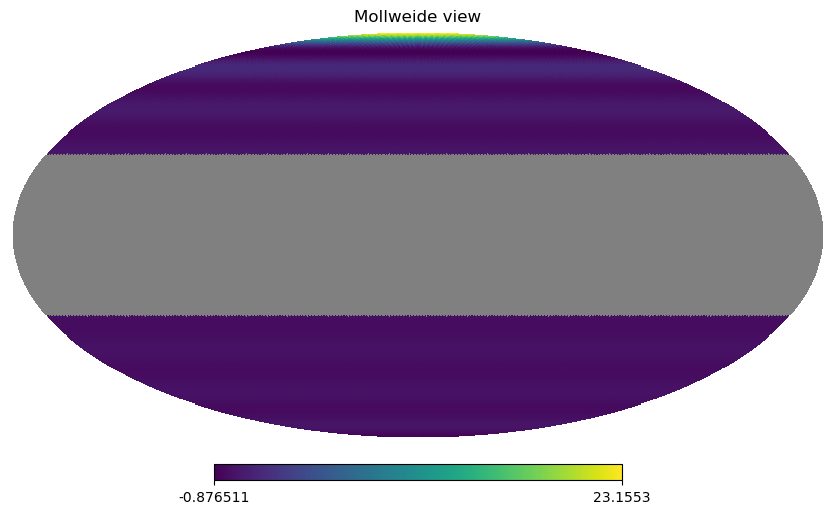

In [725]:
masked_map_quad1 = hp.ma (map_alm)
masked_map_quad1.mask = np.logical_not(mask1)
hp.mollview (masked_map_quad1)

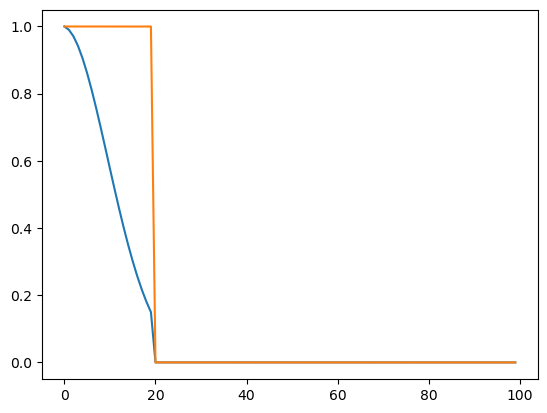

In [726]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[:100], hp.map2alm(smoothed_map)[:100])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:100], hp.map2alm(map_alm)[:100])

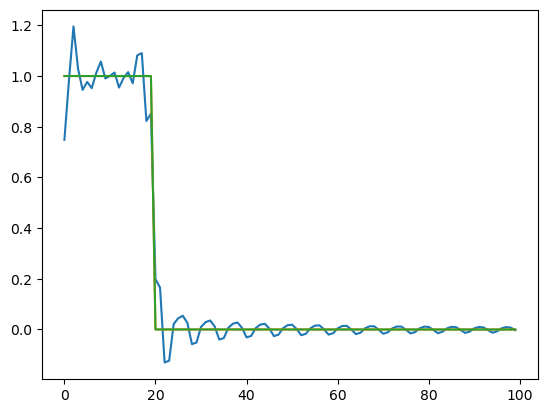

In [727]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[:100], hp.map2alm(masked_map_quad1)[:100])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:100], hp.map2alm(map_alm)[:100])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:100], hp.map2alm(map_alm)[:100])


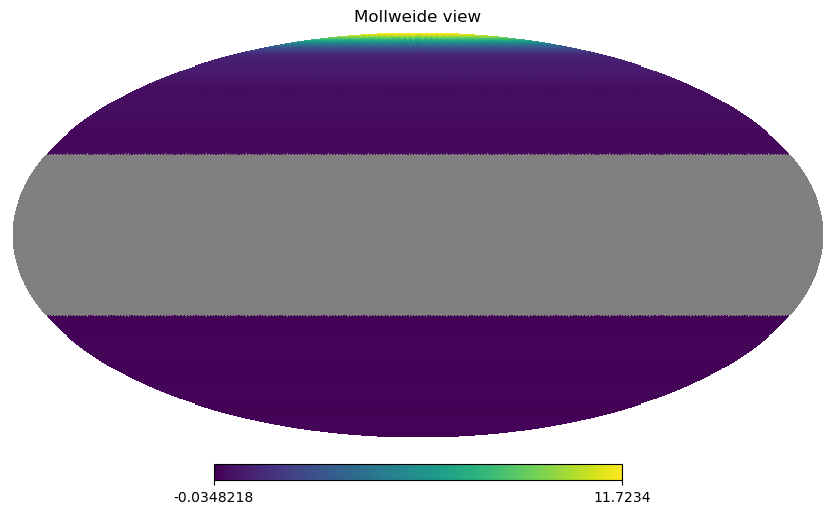

In [728]:
masked_smoothed_quad1 = hp.ma (smoothed_map)
masked_smoothed_quad1.mask = np.logical_not(mask1)
hp.mollview (masked_smoothed_quad1)

In [729]:
hp.fit_dipole(masked_map_quad1)

(0.41753470031108014, array([3.72818223e-17, 4.15091771e-18, 5.45632204e-01]))

In [730]:
hp.fit_dipole(map_alm)

(0.28194150870937806, array([2.15075421e-17, 2.88618016e-18, 4.88110095e-01]))

In [731]:
%time
masked_fitted = fit_alm(masked_map_quad1,lmax_fit=10)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 7.15 µs


In [732]:
masked_fitted

array([-3.85756902e+01-3.30333511e-20j,  3.57419269e+00-1.94689783e-23j,
        4.07908717e+01+3.29919816e-20j, -3.93842816e+00+3.17436603e-23j,
       -3.00432086e+01-2.51475318e-20j,  6.52771413e+00-3.60206259e-23j,
        2.13839904e+01+1.59572896e-20j, -3.43737022e+00+2.57280468e-23j,
       -9.85330858e+00-7.79546435e-21j,  3.50276172e+00-1.36678908e-23j,
        5.24533157e+00+2.67122104e-21j,  5.25663714e-13+7.78384627e-13j,
       -1.90364217e-15+2.86359342e-14j, -3.95262382e-13-5.91391140e-13j,
        2.71018017e-15-4.12343770e-14j,  2.62178300e-13+3.93224949e-13j,
       -2.97786969e-15+3.96183059e-14j, -1.34420253e-13-2.04474946e-13j,
        1.88374706e-15-2.70789386e-14j,  4.68835040e-14+7.22356474e-14j,
       -9.06393016e-16+1.25019691e-14j,  1.12044748e-12+1.28730165e-12j,
       -9.13223490e-16-5.87304185e-15j, -7.35336705e-13-8.42636507e-13j,
        8.75682990e-16+6.72460134e-15j,  4.46980560e-13+5.10874112e-13j,
       -7.13079769e-16-5.20232728e-15j, -2.15802636

In [733]:
%time
fit_alm(masked_map_quad1,lmax_fit=20)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 6.91 µs


array([ 9.99999250e-01-5.20792384e-17j,  1.00000000e+00-3.52805146e-19j,
        1.00000081e+00+5.80864490e-17j,  1.00000000e+00+7.45856764e-19j,
        9.99999291e-01-4.92142289e-17j,  9.99999999e-01-9.75562339e-19j,
        1.00000056e+00+4.25030346e-17j,  1.00000000e+00+1.00244447e-18j,
        9.99999615e-01-2.98106893e-17j,  1.00000000e+00-8.63257061e-19j,
        1.00000023e+00+1.91647623e-17j,  1.00000000e+00+6.35894889e-19j,
        9.99999884e-01-1.09762070e-17j,  1.00000000e+00-3.91794821e-19j,
        1.00000005e+00+5.38103984e-18j,  1.00000000e+00+2.07281329e-19j,
        9.99999983e-01-2.28310534e-18j,  1.00000000e+00-8.21254897e-20j,
        1.00000000e+00+6.52646951e-19j,  1.00000000e+00+2.46641089e-20j,
       -9.39383682e-10-1.47348009e-19j, -7.16384618e-10-1.50270023e-09j,
        5.87960930e-12+3.54967791e-13j,  6.13196494e-10+1.27840310e-09j,
       -6.18938234e-12-4.25229296e-13j, -4.91673258e-10-1.04127579e-09j,
        1.14691451e-11-6.40288170e-13j,  3.15764859

In [734]:
hp.map2alm(masked_map_quad1)

array([ 7.48281427e-01+0.00000000e+00j,  9.82406568e-01+0.00000000e+00j,
        1.19545949e+00+0.00000000e+00j, ...,
       -3.61417622e-22+4.88761309e-22j, -7.19770652e-22-1.57429365e-22j,
       -8.54897423e-23+1.67312162e-22j])

In [735]:
fit_alm(masked_smoothed_quad1,10)

array([-1.98554775e+01-3.00735520e-20j,  2.13838894e+00-1.30643148e-23j,
        2.19315639e+01+3.00048521e-20j, -1.26917951e+00+2.23771550e-23j,
       -1.54292834e+01-2.28684833e-20j,  3.35516829e+00-2.44099407e-23j,
        1.15070257e+01+1.44473889e-20j, -1.27761517e+00+1.81387963e-23j,
       -4.96118512e+00-7.06236244e-21j,  1.82388727e+00-7.71007721e-24j,
        2.75631592e+00+2.36493643e-21j,  2.58438453e-13+4.00822821e-13j,
       -1.04294828e-15+1.61650952e-14j, -1.92767026e-13-3.03200119e-13j,
        1.55078858e-15-2.33704860e-14j,  1.29293386e-13+2.02019784e-13j,
       -1.58114624e-15+2.23306142e-14j, -6.61537340e-14-1.04687824e-13j,
        1.10613016e-15-1.53386452e-14j,  2.28655799e-14+3.69053610e-14j,
       -4.99193785e-16+7.07003154e-15j,  5.87013728e-13+6.65843465e-13j,
       -3.24718551e-16-3.48984689e-15j, -3.84836369e-13-4.35923379e-13j,
        3.08713016e-16+3.97097177e-15j,  2.34109824e-13+2.64562704e-13j,
       -2.75787151e-16-3.09821613e-15j, -1.13138015

In [736]:
hp.map2alm(masked_smoothed_quad1)

array([ 7.63066347e-01+0.00000000e+00j,  9.65433944e-01+0.00000000e+00j,
        1.16521236e+00+0.00000000e+00j, ...,
       -4.10592706e-22+3.56207925e-22j,  3.97734461e-22+3.03556664e-22j,
        1.87004528e-22-1.35391635e-22j])

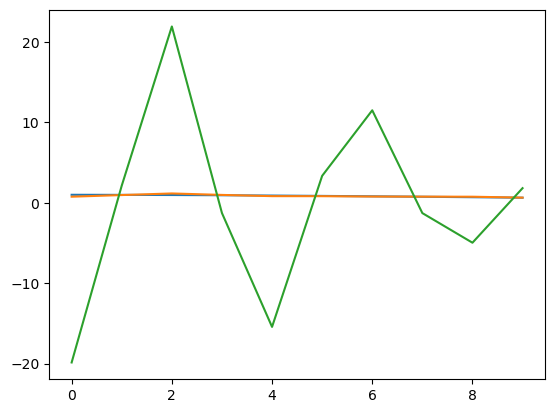

In [737]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[:10], hp.map2alm(smoothed_map)[:10])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:10], hp.map2alm(masked_smoothed_quad1)[:10])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:10], fit_alm(masked_smoothed_quad1,10)[:10])

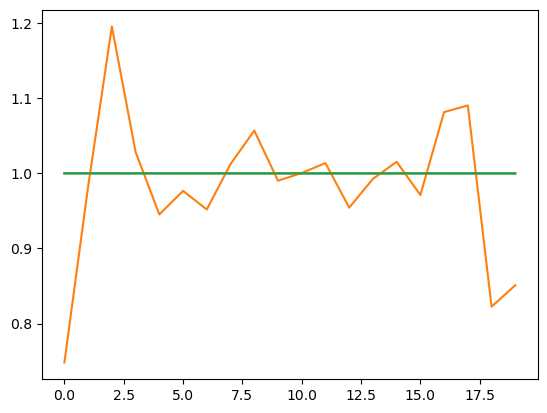

In [738]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[:20], hp.map2alm(map_alm)[:20])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:20], hp.map2alm(masked_map_quad1)[:20])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:20], fit_alm(masked_map_quad1,20)[:20])

# A more complicated map

In [45]:
cl=np.exp(50-ell)/(np.exp((50-ell))+np.exp((ell-50)))
#cl = dl* 2 * np.pi / (ell*(ell+1.))

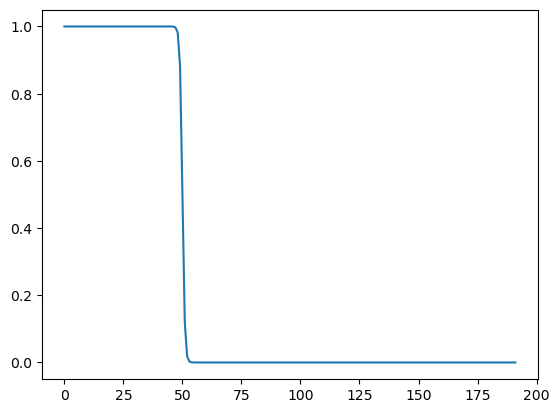

In [46]:
plt.plot(ell, cl)

In [47]:
map_cl = hp.synfast(cl, nside)


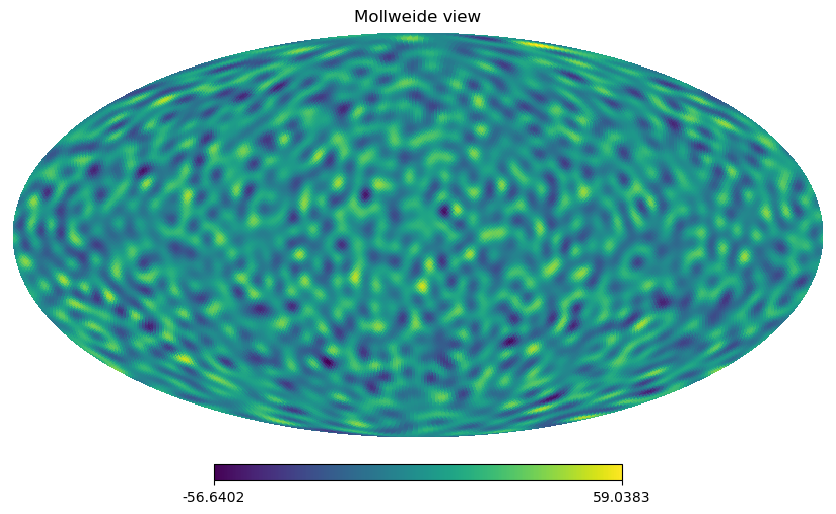

In [48]:
hp.mollview(map_cl)

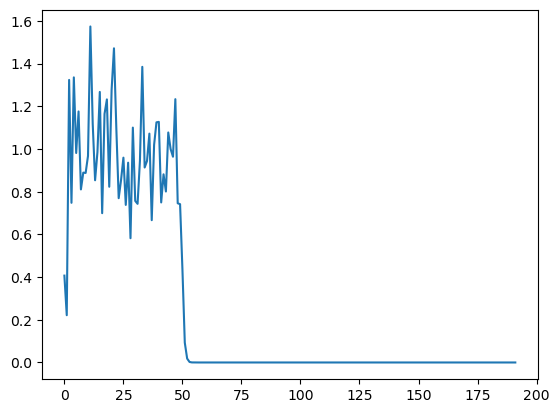

In [781]:
plt.plot(ell, hp.anafast(map_cl))

In [782]:
alm_cl = hp.map2alm(map_cl, lmax= lmax)
alm_cl

array([ 6.37919300e-01+0.00000000e+00j,  3.39294752e-01+0.00000000e+00j,
        6.49315423e-01+0.00000000e+00j, ...,
       -2.57327073e-17+2.20112279e-17j, -5.16545456e-17-4.37370776e-17j,
       -1.79221406e-17+2.56713393e-17j])

In [783]:
quad_cl = fit_quadrupole_shortened(map_cl)

In [784]:
alm_cl_out = fit_alm(map_cl, 10)
alm_cl_out

array([ 0.63816202+4.38792944e-10j,  0.3392522 -4.41845151e-10j,
        0.65000872+9.80953235e-10j, -0.97081047-6.74688738e-10j,
        0.73258464+1.31536020e-09j,  0.72094774-8.45149606e-10j,
        1.70082018+1.57943359e-09j,  1.68638903-9.85850308e-10j,
       -0.29969592+1.80393125e-09j, -0.15881709-1.10800616e-09j,
        0.77357172+2.00187751e-09j,  0.0099596 -5.23823219e-01j,
        1.40809996-1.06413301e-01j, -0.35367565+2.87800199e-01j,
       -0.45480087+7.01521284e-01j,  1.54160203-7.51897407e-01j,
       -1.00584496-1.12729876e+00j,  0.29246252+4.21823232e-01j,
        0.74014265-3.69965438e-01j, -0.12187019-1.31921697e+00j,
       -0.16965255+2.21128305e-01j,  0.04815276+1.04976494e+00j,
       -0.30480101-1.12597114e+00j, -0.48180494-6.58539592e-01j,
        0.61470339+2.26033041e-01j, -0.11233504+6.51134854e-01j,
        0.47405003+7.25634431e-01j,  0.13656183-2.38100694e-01j,
       -0.5722479 -4.04399790e-01j, -1.04147221-2.69653606e-01j,
        0.18797763-7.3706

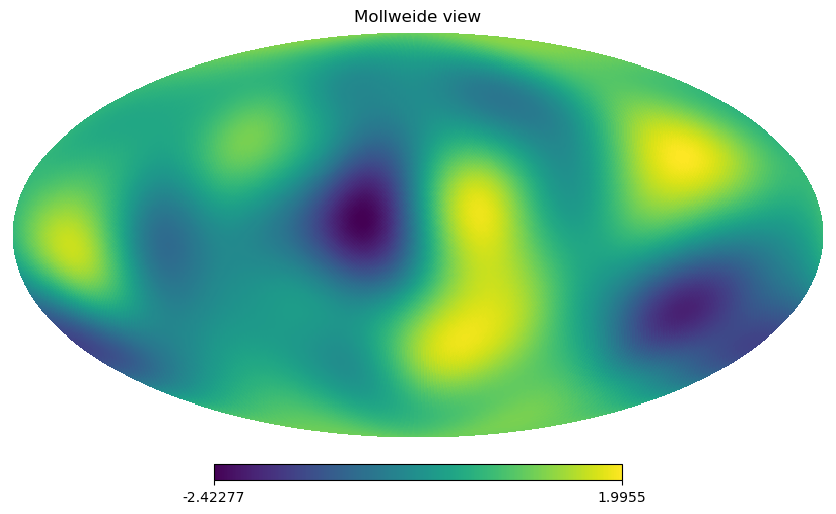

In [785]:
smoothed_map = hp.smoothing(map_cl, sigma=0.3 )
hp.mollview (smoothed_map)

(-0.5, 10.0)

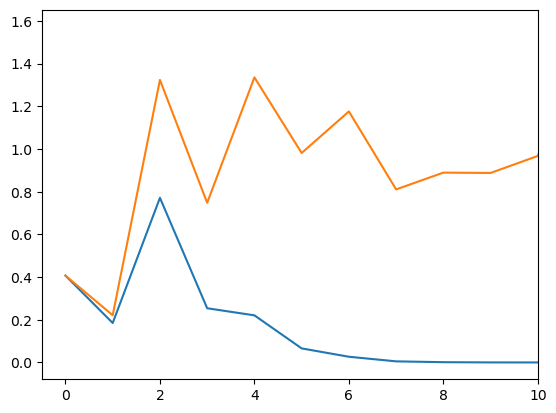

In [786]:
smoothed_cl = hp.anafast(smoothed_map)
plt.plot(ell, smoothed_cl)
plt.plot(ell, hp.anafast(map_cl))
plt.xlim(-0.5,10)

(-10.0, 100.0)

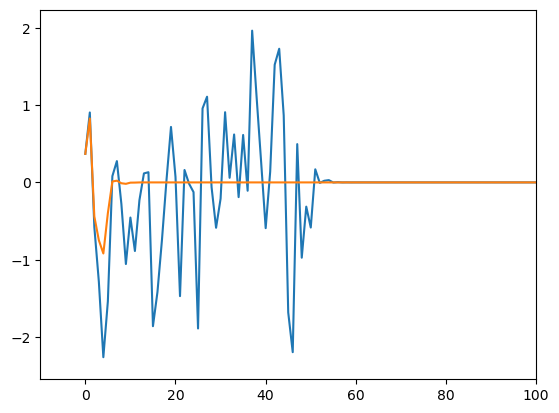

In [749]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[:], hp.map2alm(map_cl)[:])
plt.plot(np.arange(hp.Alm.getsize(lmax))[:], hp.map2alm(smoothed_map)[:])
#plt.plot(np.arange(hp.Alm.getsize(lmax))[:], hp.map2alm(masked_cl_map1)[:])
plt.xlim(-10,100)

In [750]:
smoothed_alm = hp.map2alm(smoothed_map)

In [751]:
smoothed_alm

array([ 3.68965937e-01+0.00000000e+00j,  8.26584167e-01+0.00000000e+00j,
       -4.40319988e-01+0.00000000e+00j, ...,
       -2.31791292e-19+1.91451807e-18j,  1.70709009e-18-3.28573537e-19j,
        1.28590398e-18+1.18828475e-18j])

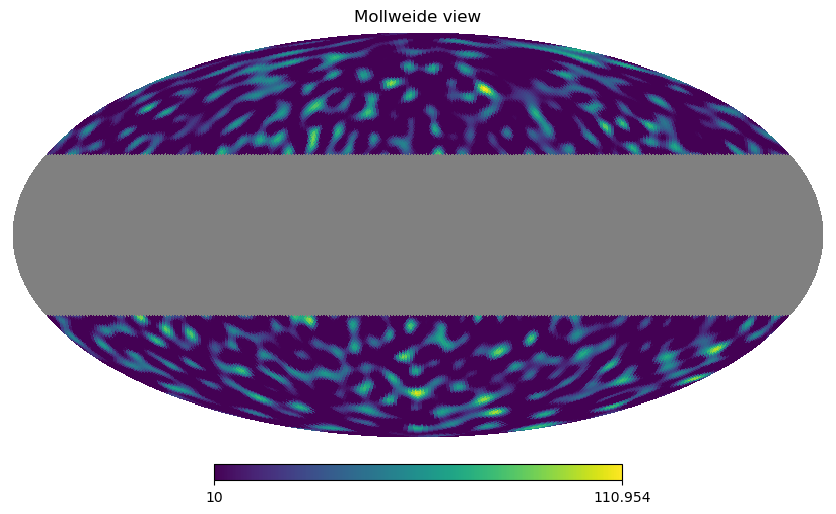

In [777]:
masked_cl_map1 = hp.ma (map_cl)
masked_cl_map1.mask = np.logical_not(mask1)
hp.mollview (masked_cl_map1)

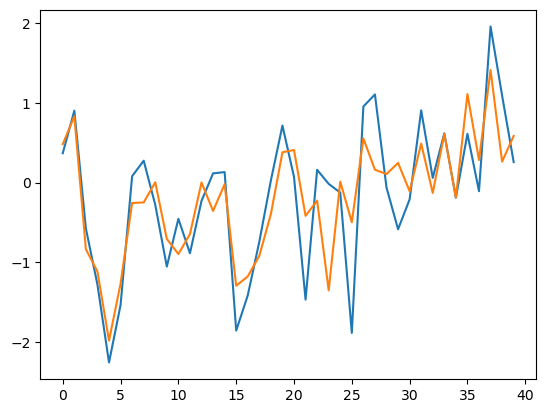

In [753]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[0:40], hp.map2alm(map_cl)[0:40])
plt.plot(np.arange(hp.Alm.getsize(lmax))[0:40], hp.map2alm(masked_cl_map1)[0:40])

#plt.plot(np.arange(hp.Alm.getsize(lmax))[0:40], fit_alm(masked_cl_map1,40)[0:40])

(-10.0, 100.0)

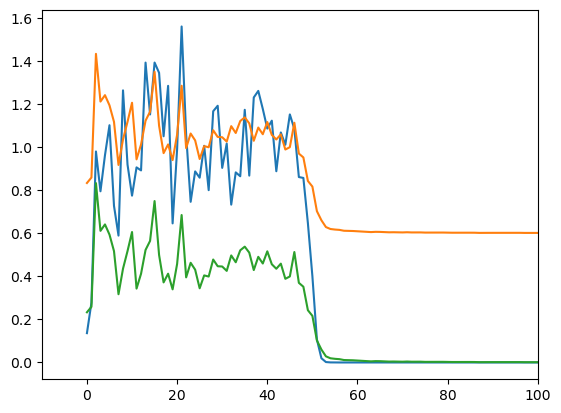

In [754]:
plt.plot(ell[:], hp.anafast(map_cl)[:])
plt.plot(ell[:], hp.anafast(masked_cl_map1)[:]+0.6)
plt.plot(ell[:], hp.alm2cl(hp.map2alm(masked_cl_map1))[:])

plt.xlim(-10,100)

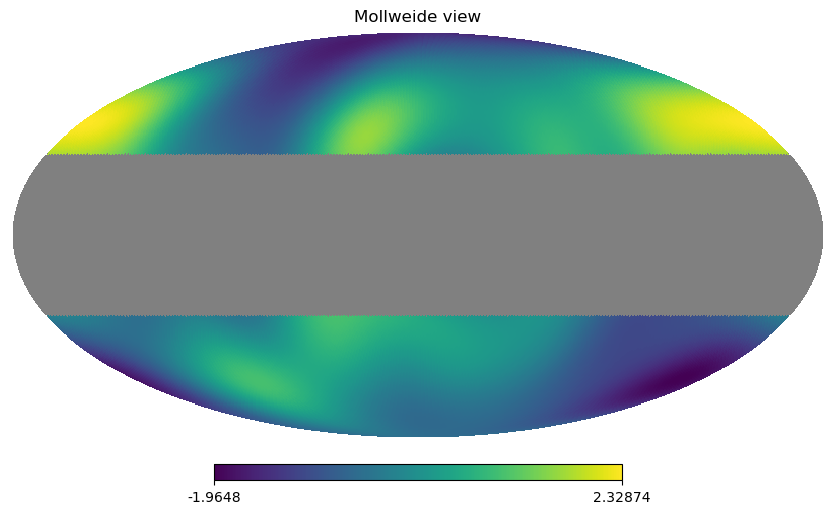

In [755]:
masked_smoothed_map1 = hp.ma (smoothed_map)
masked_smoothed_map1.mask = np.logical_not(mask1)
hp.mollview (masked_smoothed_map1)

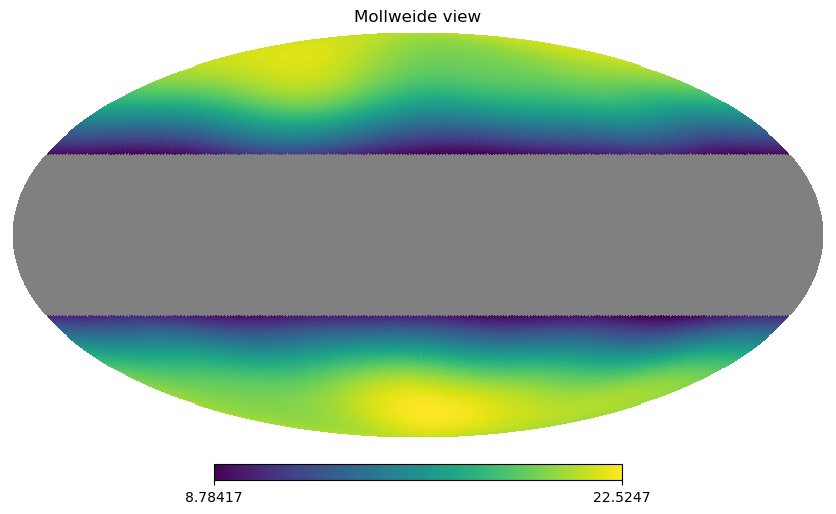

In [778]:
smoothed_masked_map = hp.smoothing(masked_cl_map1, sigma=0.3 )
hp.mollview (smoothed_masked_map)

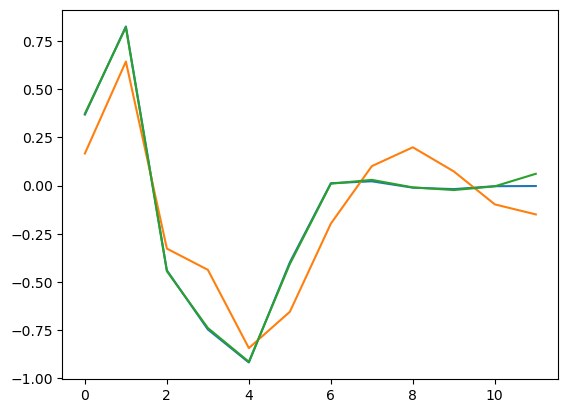

In [756]:
plt.plot(np.arange(hp.Alm.getsize(lmax))[0:12], hp.map2alm(smoothed_map)[0:12] )
plt.plot(np.arange(hp.Alm.getsize(lmax))[0:12], hp.map2alm(masked_smoothed_map1)[0:12])
plt.plot(np.arange(hp.Alm.getsize(lmax))[0:12], fit_alm(masked_smoothed_map1,10)[0:12])

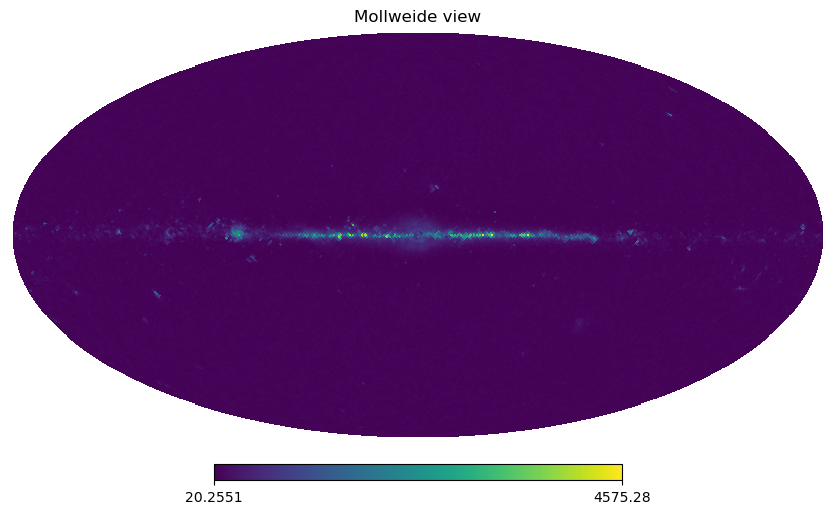

In [757]:
quasar_map = hp.read_map('/Users/arefe/Downloads/quasar_map-1.fits')
hp.mollview(quasar_map)

In [758]:
alm_quasar = hp.map2alm(quasar_map)

In [759]:

alm_smoothed = np.zeros (len(alm_quasar), dtype = np.complex128)
for l in range(0,20):
    for m in range (0,l+1):
        
        ind = hp.Alm.getidx(lmax, l,m)
        #print (ind)
        alm_smoothed [ind] = alm_quasar[ind]


In [760]:
quasar_mask = hp.read_map('/Users/arefe/Downloads/quasar_mask.fits')
#quasar_mask = np.logical_not(quasar_mask)

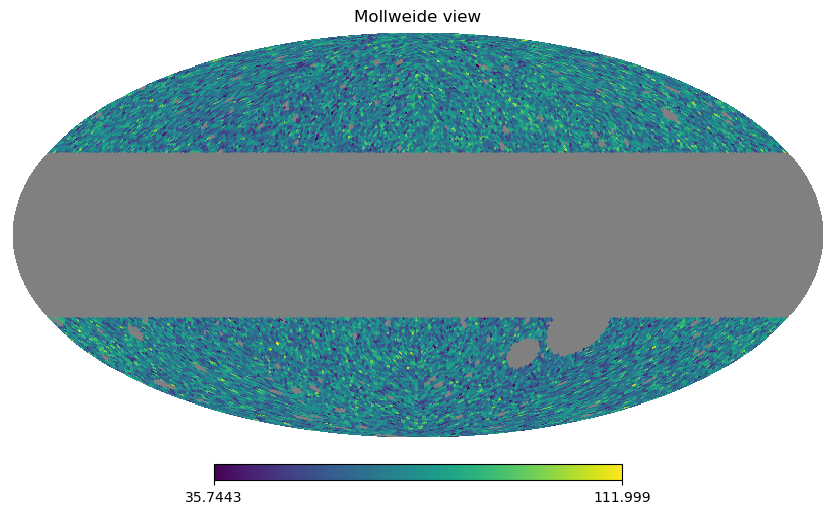

In [761]:
masked_quasar_map1 = hp.ma (quasar_map)
masked_quasar_map1.mask = np.logical_not(quasar_mask)
hp.mollview (masked_quasar_map1)

In [762]:
hp.alm2cl(fit_alm(masked_quasar_map1,10))

array([5.45871330e+04, 1.47781375e+02, 2.19444579e+02, 1.63686089e+02,
       1.19715537e+02, 4.60335771e+01, 2.64351422e+01, 1.08625964e+01,
       5.66605568e+00, 6.93226972e-01, 1.14057279e+00])

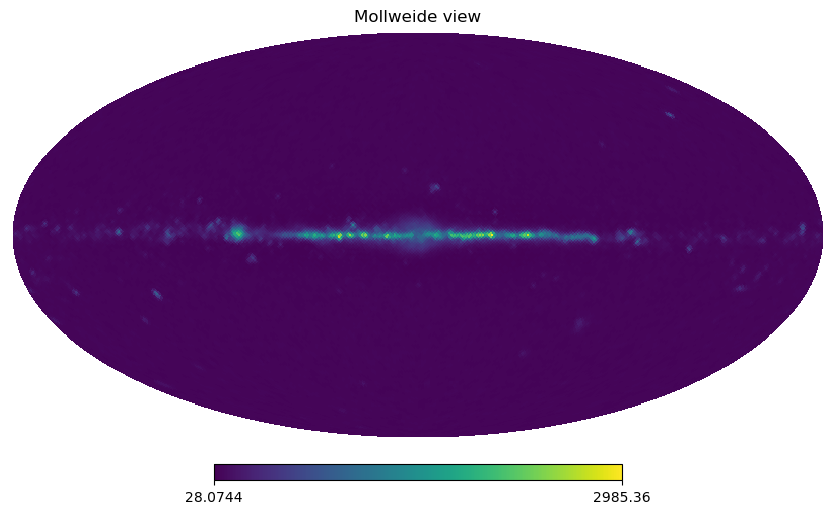

In [763]:
smoothed_quasar_map = hp.smoothing(quasar_map, sigma=0.01)
hp.mollview (smoothed_quasar_map)

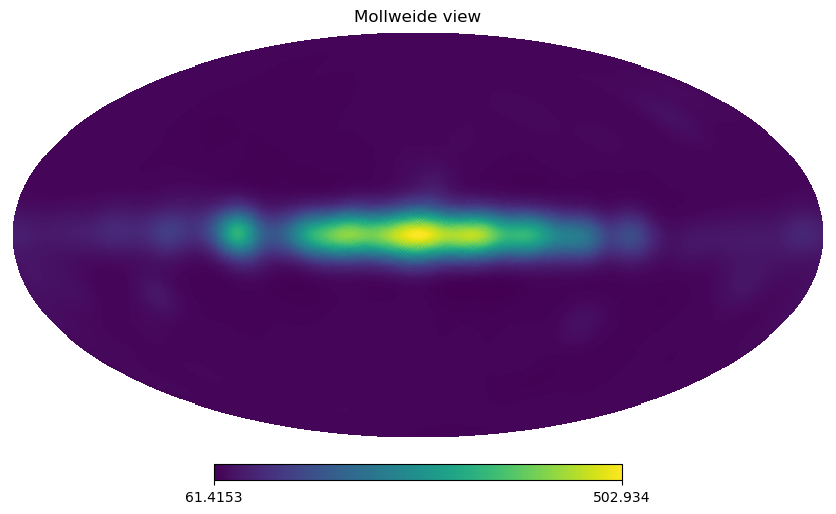

In [773]:
#alm_smooth = hp.smoothalm(alm_quasar, fwhm=0.1)
smoothed_quasar = hp.smoothing(quasar_map, sigma = 0.1)
hp.mollview(smoothed_quasar)

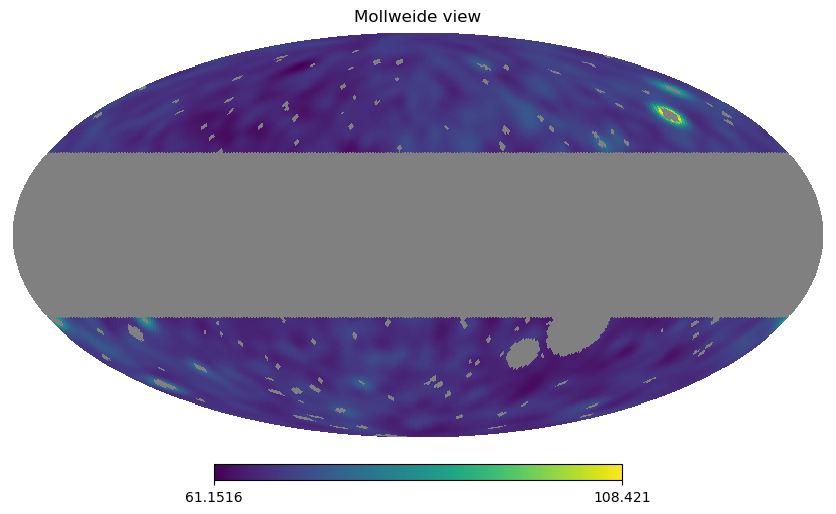

In [765]:
masked_smoothed_quasar_map1 = hp.ma (smoothed_quasar)
masked_smoothed_quasar_map1.mask = np.logical_not(quasar_mask)
hp.mollview (masked_smoothed_quasar_map1)

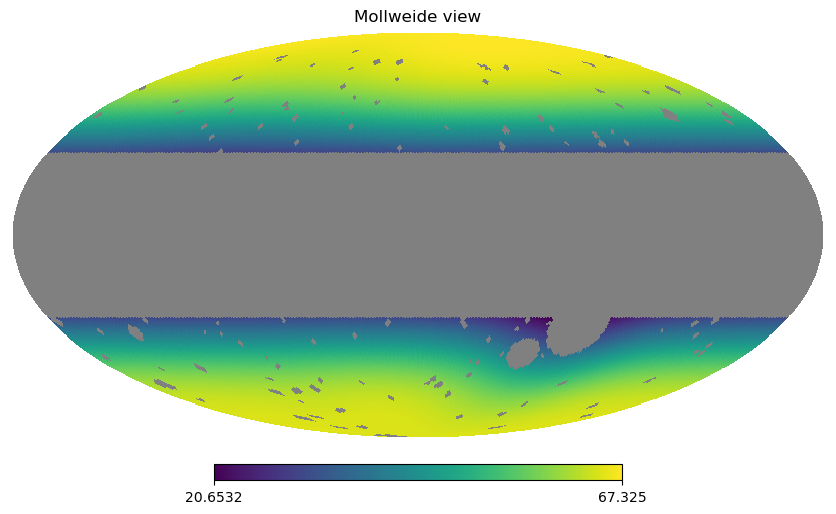

In [767]:
smoothed_quasar_map = hp.smoothing(masked_quasar_map1, sigma=0.3)
hp.mollview (smoothed_quasar_map)

In [174]:
lmax_fit = 10

quasar_smoothed_masked_alm = fit_alm(masked_smoothed_quasar_map1, lmax_fit)


In [162]:
alm2dipole(quasar_smoothed_masked_alm, lmax=lmax_fit)

((-272.26895467855667+10.484666011559504j),
 array([-4.98201222e+02+0.j        ,  6.20798848e+00+0.j        ,
         3.02625392e-01-2.60616305j]))

In [163]:
theta, phi = hp.vec2ang(alm2dipole(quasar_smoothed_masked_alm, lmax=lmax_fit)[1].real)
print (90-theta*180/np.pi, phi*180/np.pi)

[0.03480082] [179.28608539]


In [265]:
print(hp.fit_dipole(masked_smoothed_quasar_map1))
theta, phi = hp.vec2ang(hp.fit_dipole(masked_smoothed_quasar_map1)[1])
print (90-theta*180/np.pi, phi*180/np.pi)

(71.14184335821788, array([ 4.78423656, -0.26333226,  0.23448009]))
[2.80164277] [356.84952495]


In [266]:
hp.fit_dipole(masked_quasar_map1)

(67.80486528385919, array([-0.5549617 , -0.90850106,  0.39641624]))

In [230]:
theta, phi = hp.vec2ang(hp.fit_dipole(masked_quasar_map1)[1])
print (90-theta*180/np.pi, phi*180/np.pi)

[20.42353844] [238.58115242]


In [589]:
hp.alm2cl(hp.map2alm(masked_quasar_map1))

array([1.29786490e+04, 6.89186178e+00, 1.94416847e+03, 3.52359572e+00,
       1.60975555e+02, 2.94061822e+00, 1.22638017e+01, 2.10796875e+00,
       4.32045852e+01, 1.04733941e+00, 1.14397298e+01, 8.29079889e-01,
       2.04507533e+00, 5.01092124e-01, 8.80816007e+00, 5.42993312e-01,
       3.32242287e+00, 4.00333502e-01, 8.96599903e-01, 2.71858644e-01,
       3.41002480e+00, 2.44483337e-01, 1.28754450e+00, 2.21578920e-01,
       5.84316154e-01, 2.49937095e-01, 1.64345194e+00, 1.73235448e-01,
       4.88741604e-01, 1.68540213e-01, 2.76810019e-01, 1.24570065e-01,
       8.09154698e-01, 1.19949236e-01, 3.21334712e-01, 1.03747986e-01,
       2.40107261e-01, 1.15342997e-01, 5.62262002e-01, 1.27182393e-01,
       1.95918029e-01, 7.69214208e-02, 1.93092193e-01, 1.28443188e-01,
       3.66622553e-01, 1.05908602e-01, 1.47102321e-01, 7.19840167e-02,
       1.70091635e-01, 8.51390717e-02, 2.68557515e-01, 6.98964382e-02,
       1.28657987e-01, 6.37491164e-02, 1.07103936e-01, 7.08950957e-02,
      

# point picking

In [342]:
import random as rand
sim_qsr_dip_map = point_picking_old(weighting=dipole_map, points=10000) 

10000


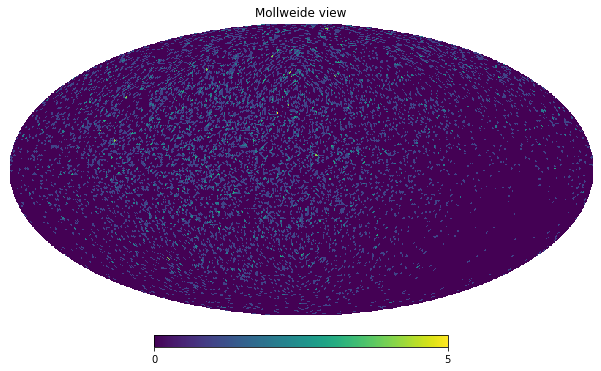

In [146]:
hp.mollview(sim_qsr_dip_map)

In [147]:
sim_qsr_dip_cl = hp.anafast(sim_qsr_dip_map)
fit_dipole(sim_qsr_dip_map)

(0.20345052083333331, array([0.11866006, 0.11866373, 0.11963645]))

In [126]:
print(calc_D(fit_dipole(sim_qsr_dip_map)))
print (calc_D(fit_dipole(dipole_map)))

1.0044817079904882
1.0000146866108943


[1.82730735e+01 3.60896465e-01 9.72211392e-12]


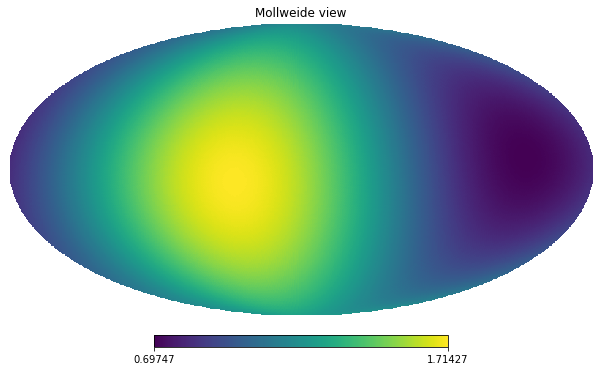

In [228]:
test_cl = np.zeros(lmax+1)
test_cl[0] = 100 
test_cl[1] = 1
test_map = hp.synfast(test_cl,nside,lmax =lmax)
#test_map+=abs(min(test_map))
hp.mollview(test_map)
#print (hp.anafast(test_map))
print (hp.anafast(test_map)[:3])

test_map = np.abs(test_map)


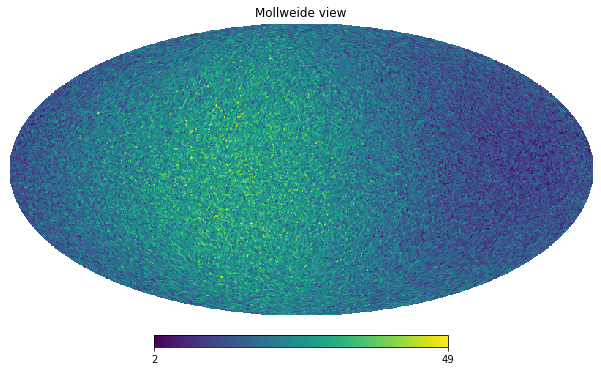

In [229]:
sim_qsr_test_map = point_picking_old(weighting=test_map, points=1000000) 
hp.mollview(sim_qsr_test_map)

In [195]:
mas = hp.ma(sim_qsr_test_map, badval=UNSEEN)

In [227]:
hp.alm2cl (fit_alm(sim_qsr_test_map,2))

array([5.20148075e+03, 1.51790304e+00, 2.29658839e+01])

In [736]:
N_t = 1000
l_f = 10
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0:l_f] = 1


for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]/=np.sqrt(tmp_cl_norm[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,9))
    dip_out[i] = cl_out[1]
    

Text(0.5, 0, 'C_1')

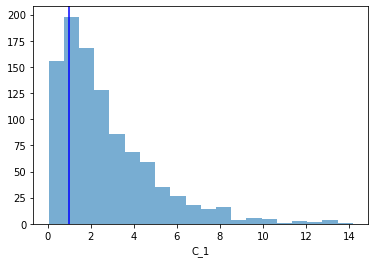

In [737]:
plt.axvline(x = 1, color = 'b', label = 'axvline - full height')

plt.hist (dip_out, 20,  alpha= 0.6)
plt.xlabel ("C_1")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [747]:
np.mean (dip_out)

2.701457132503439

In [748]:
np.std (dip_out)

2.291062899766648

In [749]:
np.count_nonzero(dip_out>4)

213

In [819]:
hp.alm2cl(dipole2alm([1,[0,0.007, 0]],1))

array([1.25663706e+01, 6.84169067e-05])

In [105]:
nside = 64
N_t = 1000
l_f = 4
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

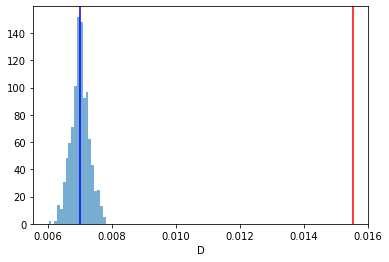

In [106]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [211]:
nside = 64
N_t = 1000
l_f = 4
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

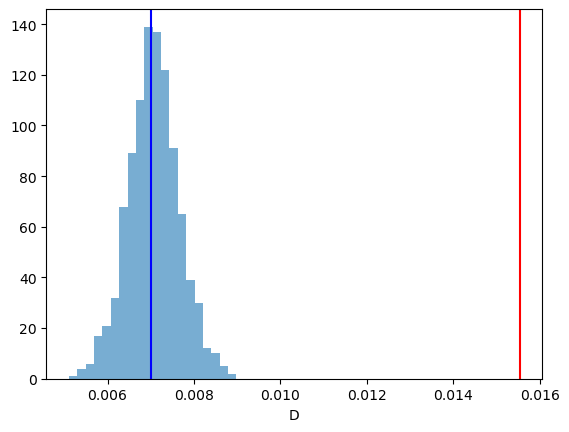

In [212]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [205]:

nside = 64
lmax = 3*nside-1
N_t = 1000
l_f = 8
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

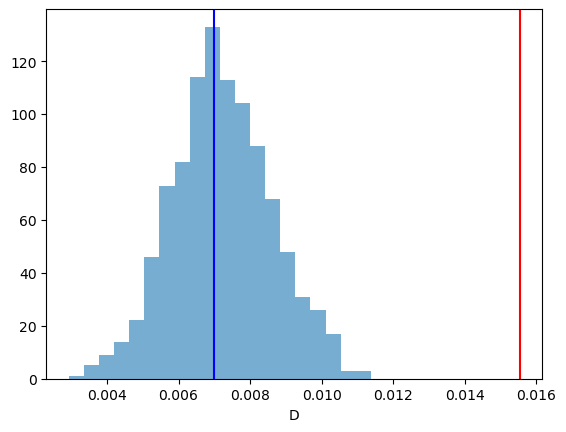

In [206]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [204]:
dip_out

array([5.45050249e-06, 5.44694708e-06, 5.44181630e-06, 5.44196956e-06,
       5.42155704e-06, 5.44707719e-06, 5.44089770e-06, 5.43554574e-06,
       5.44666294e-06, 5.44507156e-06, 5.44415433e-06, 5.47693635e-06,
       5.43875611e-06, 5.44975743e-06, 5.44594421e-06, 5.44308947e-06,
       5.43512584e-06, 5.44317577e-06, 5.44794524e-06, 5.43819747e-06,
       5.44024637e-06, 5.44482483e-06, 5.46308146e-06, 5.44136540e-06,
       5.44601464e-06, 5.44339747e-06, 5.44119074e-06, 5.44667745e-06,
       5.44446679e-06, 5.44758691e-06, 5.44770261e-06, 5.43513771e-06,
       5.42197921e-06, 5.45332094e-06, 5.43904491e-06, 5.44622201e-06,
       5.44075465e-06, 5.44902089e-06, 5.47427898e-06, 5.43948284e-06,
       5.44339272e-06, 5.44485952e-06, 5.42404068e-06, 5.44557375e-06,
       5.44397672e-06, 5.44006064e-06, 5.47126079e-06, 5.44671687e-06,
       5.43742725e-06, 5.44303378e-06, 5.43830446e-06, 5.42718463e-06,
       5.44352043e-06, 5.45970173e-06, 5.45437261e-06, 5.44629671e-06,
      

In [209]:
N_t = 1000
l_f = 8
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

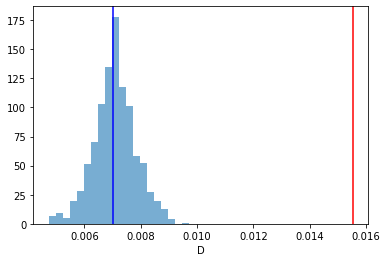

In [210]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [211]:
N_t = 1000
l_f = 20
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

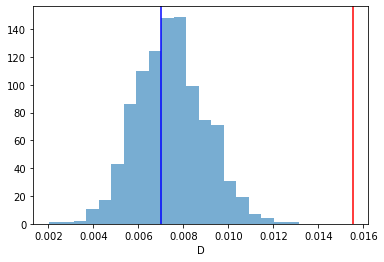

In [212]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [213]:
N_t = 1000
l_f = 20
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

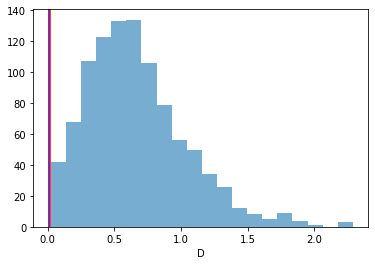

In [214]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [113]:
N_t = 1000
l_f = 6
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

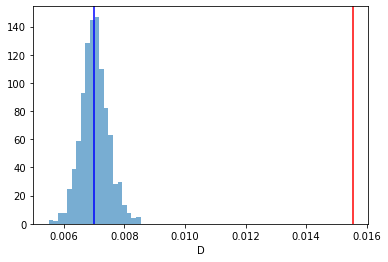

In [114]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [115]:
N_t = 1000
l_f = 6
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

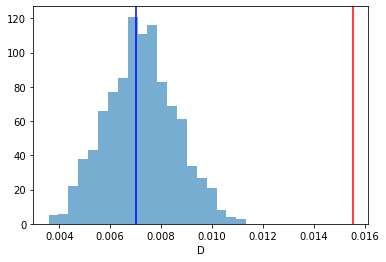

In [116]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [ ]:
N_t = 1000
l_f = 10
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-7
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    tmp_map = hp.alm2map(tmp_alm, nside)
    #hp.mollview(tmp_map)
    
    tmp_masked = hp.ma (tmp_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(tmp_map)
    
    dip_sol[i] = cl_sol[1]
    
    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

(array([ 68., 139., 129., 120., 105.,  88.,  74.,  63.,  37.,  51.,  34.,
         27.,  18.,  13.,  11.,   9.,   9.,   3.,   0.,   2.]),
 array([3.51928364e-08, 2.19171850e-06, 4.34824417e-06, 6.50476983e-06,
        8.66129549e-06, 1.08178212e-05, 1.29743468e-05, 1.51308725e-05,
        1.72873982e-05, 1.94439238e-05, 2.16004495e-05, 2.37569751e-05,
        2.59135008e-05, 2.80700265e-05, 3.02265521e-05, 3.23830778e-05,
        3.45396035e-05, 3.66961291e-05, 3.88526548e-05, 4.10091805e-05,
        4.31657061e-05]),
 <a list of 20 Patch objects>)

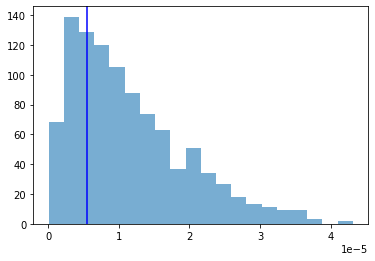

In [93]:
plt.axvline(x = tmp_cl[1], color = 'b', label = "input dipole")

plt.hist (dip_out, 20,  alpha= 0.6)

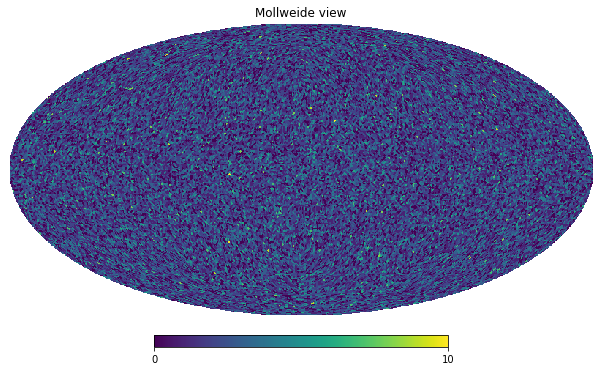

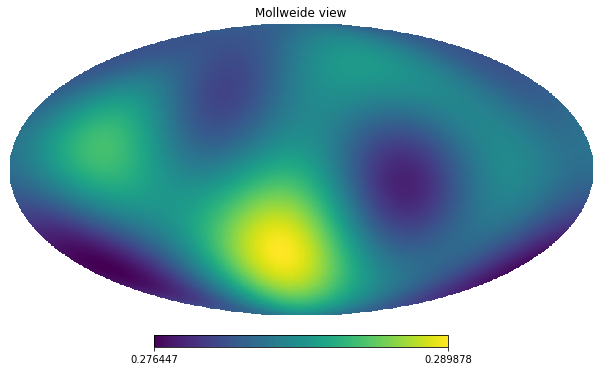

In [394]:
import random 
N_t = 100
l_f = 10
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
mono_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    #print (tmp_alm)
    
    tmp_map = hp.alm2map(tmp_alm, nside)
    #print (tmp_map)
    tmp_map = np.abs (tmp_map)
    quas_map = point_picking_old(tmp_map,100000)
    hp.mollview(quas_map)
    hp.mollview(tmp_map)

    tmp_masked = hp.ma (quas_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    cl_sol = hp.anafast(quas_map)
    dip_sol[i] = cl_sol[1]
    mono_sol[i] = cl_sol[0]

    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

In [395]:
cl_sol

array([5.20156799e+01, 2.06884113e-03, 7.04086073e-04, 3.63772532e-04,
       6.20112456e-04, 6.40843487e-04, 5.98684752e-04, 3.27344320e-04,
       3.93712591e-04, 5.67234059e-04, 5.18149084e-04, 4.05324029e-04,
       5.52659350e-04, 8.64530834e-04, 6.21639443e-04, 7.52863960e-04,
       7.58881213e-04, 2.73761977e-04, 4.97597810e-04, 3.83484051e-04,
       4.12725458e-04, 5.76112082e-04, 4.45711484e-04, 4.90739347e-04,
       4.22044823e-04, 2.87449115e-04, 3.13791319e-04, 3.45688960e-04,
       4.43015424e-04, 6.27373695e-04, 4.90794730e-04, 4.98985421e-04,
       7.03030303e-04, 6.32288096e-04, 5.31658033e-04, 5.73210317e-04,
       4.02850856e-04, 6.41439684e-04, 5.14715250e-04, 4.51340194e-04,
       5.29000052e-04, 3.95182463e-04, 4.55325700e-04, 4.73274500e-04,
       4.77388773e-04, 6.39251064e-04, 4.47845127e-04, 5.68763384e-04,
       5.07264681e-04, 4.93416763e-04, 5.21841828e-04, 5.74251315e-04,
       4.14876642e-04, 4.25757348e-04, 5.61163843e-04, 5.73081439e-04,
      

Text(0.5, 0, 'D')

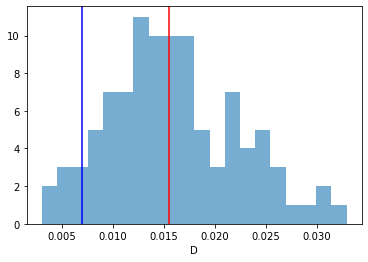

In [330]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

Text(0.5, 0, 'D')

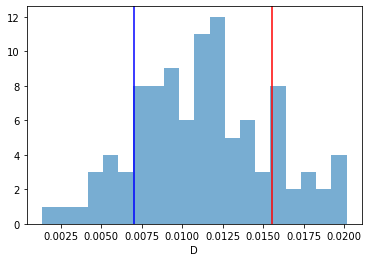

In [331]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_sol/mono_sol), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

In [393]:
3*np.sqrt(dip_sol/mono_sol)

array([0.27034411])

monopole and dipole + quadrupole + octopole, estimated by fit_alm with maximum fitted l of 4 

In [255]:
import random 
N_t = 1000
l_f = 4
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    #print (tmp_alm)
    
    tmp_map = hp.alm2map(tmp_alm, nside)
    #print (tmp_map)
    tmp_map = np.abs (tmp_map)
    quas_map = point_picking_old(tmp_map,100000)
    
    quas_map = np.copy (quas_map)

    tmp_masked = hp.ma (quas_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    #cl_sol = hp.anafast(tmp_map)
    #dip_sol[i] = cl_sol[1]

    #tmp_fitted = hp.fit_dipole(tmp_masked)
    #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

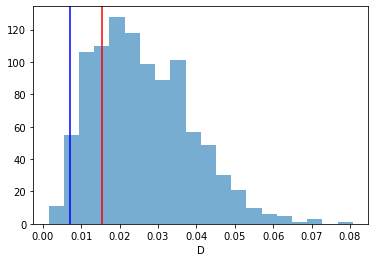

In [256]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

monopole and dipole + quadrupole + octopole, estimated by healpy fit_dipole

In [211]:
import random 
N_t = 1000
l_f = 4
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    #print (tmp_alm)
    
    tmp_map = hp.alm2map(tmp_alm, nside)
    #print (tmp_map)
    tmp_map = np.abs (tmp_map)
    quas_map = point_picking_old(tmp_map,100000)
    
    quas_map = np.copy (quas_map)

    tmp_masked = hp.ma (quas_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    #cl_sol = hp.anafast(tmp_map)
    #dip_sol[i] = cl_sol[1]

    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    

Text(0.5, 0, 'D')

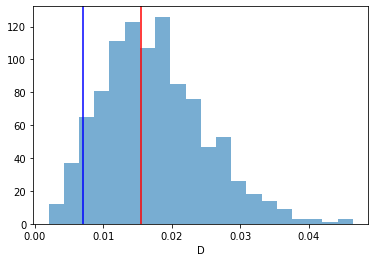

In [212]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (3*np.sqrt(dip_out/mono_out), 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

only monopole and dipole, estimated by the healpy fit_dipole

In [257]:
import random 
N_t = 1000
l_f = 2
D_arr = np.zeros (N_t)
dip_out = np.zeros (N_t)
dip_sol = np.zeros (N_t)
tmp_cl = np.zeros(lmax+1)
tmp_cl[0] = 1
tmp_cl[1] = 5.444e-6
tmp_cl[2:l_f] = 5.444e-6
mono_out = np.zeros (N_t)

for i in range (N_t):
    
    tmp_alm = hp.synalm(tmp_cl)
    tmp_cl_norm = hp.alm2cl(tmp_alm)
    #print (tmp_cl_norm)
    for l in range (l_f):
        for m in range (0,l+1):
            ind = hp.Alm.getidx(lmax, l, m)
            tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
    #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
    #print (tmp_alm)
    
    tmp_map = hp.alm2map(tmp_alm, nside)
    #print (tmp_map)
    tmp_map = np.abs (tmp_map)
    quas_map = point_picking_old(tmp_map,1000000)
    
    tmp_masked = hp.ma (quas_map)
    tmp_masked.mask = np.logical_not(quasar_mask)
    #quas_map = hp.remove_monopole(quas_map)
    #cl_sol = hp.anafast(quas_map)
    #print (cl_sol)
    #hp.mollview(tmp_map)
    #hp.mollview(quas_map)
    #dip_sol[i] = cl_sol[1]

    tmp_fitted = hp.fit_dipole(tmp_masked)
    cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))
    
    #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
    #alm.append (fit_alm(tmp_masked,1))
    dip_out[i] = cl_out[1]
    mono_out[i] = cl_out[0]
    D_arr[i] = 3*np.sqrt(dip_out[i]/mono_out[i])

Text(0.5, 0, 'D')

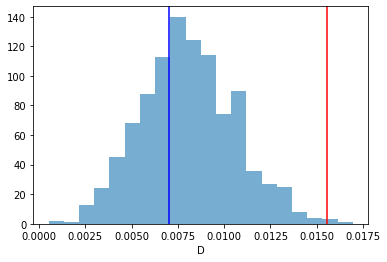

In [258]:
plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
plt.axvline(x = 0.01554, color = 'r', label = "")

plt.hist (D_arr, 20,  alpha= 0.6)
plt.xlabel ("D")
#plt.hist (dip_sol, alpha = 1, color = 'black')

# Testing the effect of quadrupole on dipole 

In [472]:
import random
N_t = 100
dip = make_dipole([1,0,0], nside)
mon = np.zeros (mapsize)+0
mono_arr = np.zeros (N_t)
dip_arr = np.zeros (N_t)

D_arr = np.zeros (N_t)
for i in range (N_t):
    
    quad_th = random.uniform(0, np.pi)
    quad_ph = random.uniform(0, 2*np.pi)
    
    qua_mat = ang2quad(10, quad_th, quad_ph)
    
   
    
    qua = make_quad(qua_mat, nside)
    ma = mon+dip+qua
    sol = hp.alm2cl(fit_alm(ma,2))

    ma_masked = hp.ma (ma)
    ma_masked.mask = np.logical_not(quasar_mask)
    
    
    #hp.mollview(ma)
    #hp.mollview(ma_masked)
    fitted_dip = fit_dipole(ma_masked)
    #print (fitted_dip)
    #print (dipole2alm(fitted_dip,1))
    
    fitted_cl = hp.alm2cl(dipole2alm(fitted_dip,1))
    #fitted_cl = hp.alm2cl(fit_alm(ma_masked,1))
    mono_arr[i] = fitted_cl[0]
    dip_arr[i] = fitted_cl[1]


    
    

Text(0.5, 0, 'C_1')

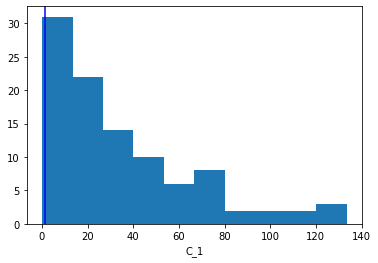

In [470]:
plt.hist(dip_arr,10)
plt.axvline(x = sol[1], color = 'b', label = 'axvline - full height')
plt.xlabel("C_1")


In [466]:
np.mean(dip_arr)

3.9995696164472423

In [467]:
np.std(dip_arr)

2.1683917310920737

In [468]:
abs(sol[1]- np.mean(dip_arr))/np.std(dip_arr)

1.2005700711377751

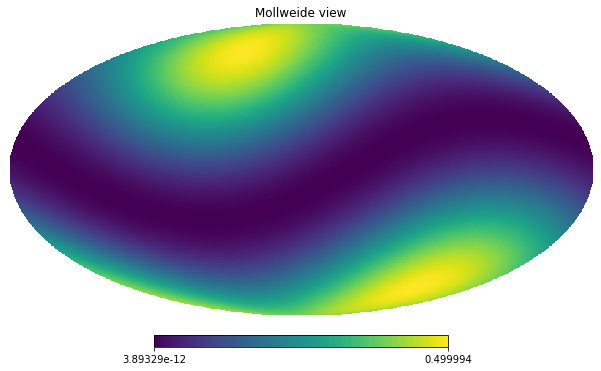

In [315]:
quaa = ang2quad(1, np.pi/7, np.pi/3)
hp.mollview(make_quad(quaa, nside))

In [442]:
dipole2alm(fitted_dip,1)

array([ 0.00000000e+00+0.00000000e+00j,  8.87594432e-19+0.00000000e+00j,
       -1.44720251e+00+5.02099233e-18j])

In [424]:
alm2dipole([ 0.00000000e+00+0.00000000e+00j,  2.11897562e-19+0.00000000e+00j,
       -3.45494149e-01-1.19867362e-18j],1)

(0j, array([ 2.38732414e-01-0.j, -8.28269446e-19-0.j,  1.03533681e-19+0.j]))

(array([25., 12.,  6.,  9., 11.,  7.,  4.,  1.,  8., 17.]),
 array([ 1290.68528266,  2260.16137364,  3229.63746462,  4199.1135556 ,
         5168.58964658,  6138.06573756,  7107.54182853,  8077.01791951,
         9046.49401049, 10015.97010147, 10985.44619245]),
 <a list of 10 Patch objects>)

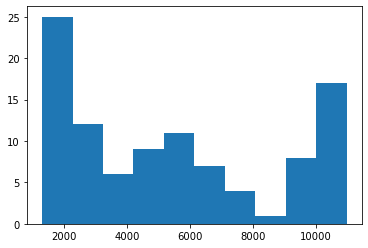

In [473]:
plt.hist(mono_arr)

1
2
3
4
5
6
7
8
9


Text(0.5, 0, '$D$')

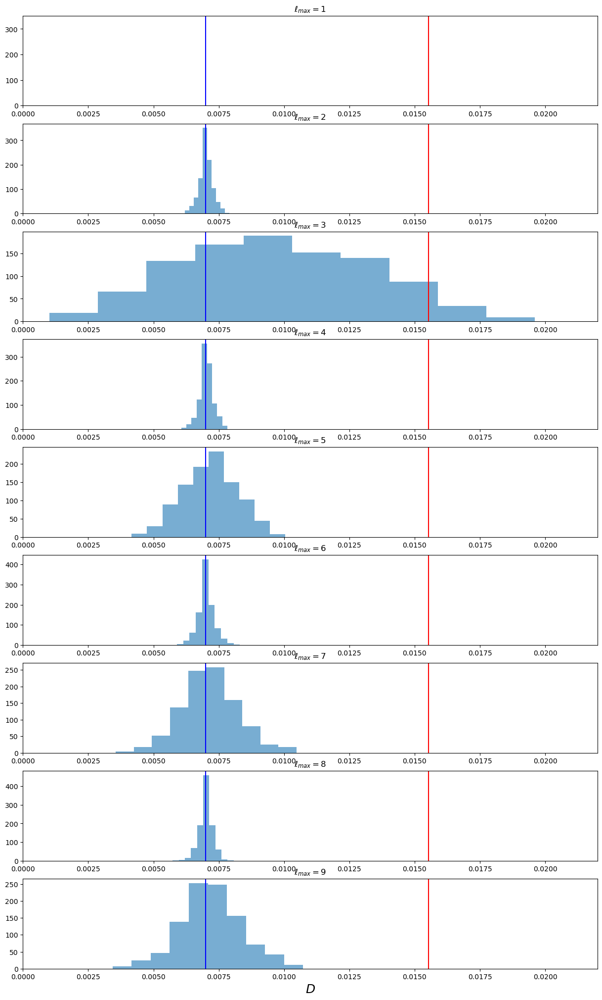

In [37]:
import random 
nside = 64
lmax = 3*nside -1
fig , ax = plt.subplots (9, 1 , figsize = (15,25))
for l_f in range (1,10):
    print(l_f)
    N_t = 1000
    #l_f = 4
    D_arr = np.zeros (N_t)
    dip_out = np.zeros (N_t)
    dip_sol = np.zeros (N_t)
    tmp_cl = np.zeros(lmax+1)
    tmp_cl[0] = 1
    tmp_cl[1] = 5.444e-6
    tmp_cl[l_f] = 5.444e-6
    mono_out = np.zeros (N_t)

    for i in range (N_t):

        tmp_alm = hp.synalm(tmp_cl)
        tmp_cl_norm = hp.alm2cl(tmp_alm)
        #print (tmp_cl_norm)
        
        for l in (np.nonzero(tmp_cl)[0]):
            
            for m in range (0,l_f+1):
                ind = hp.Alm.getidx(lmax, l, m)
                tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
        #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
        #print (tmp_alm)

        tmp_map = hp.alm2map(tmp_alm, nside)
        #print (tmp_map)
        #tmp_map = np.abs (tmp_map)
        #quas_map = point_picking_old(tmp_map,100000)

        #quas_map = np.copy (quas_map)

        tmp_masked = hp.ma (tmp_map)
        tmp_masked.mask = np.logical_not(quasar_mask)
        cl_sol = hp.anafast(tmp_map)
        dip_sol[i] = cl_sol[1]

        tmp_fitted = hp.fit_dipole(tmp_masked)
        cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))

        #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
        #alm.append (fit_alm(tmp_masked,1))
        dip_out[i] = cl_out[1]
        mono_out[i] = cl_out[0]
        D_arr[i] = 3*np.sqrt(cl_out[1]/cl_out[0])
    

    ax[l_f-1].hist (3*np.sqrt(dip_out/mono_out) , alpha = 0.6)
    #ax[l_f-1].legend()
    ax[l_f-1].set_title(r'$\ell_{max}=$'+str(l_f))
    ax[l_f-1].axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "")
    ax[l_f-1].axvline(x = 0.01554, color = 'r', label = "")
    ax[l_f-1].set_xlim(0, 0.022)
    #ax[l_f-1].set_xlabel ("D")
    #plt.legend ("l_max = %d")
    #plt.hist (dip_sol, alpha = 1, color = 'black')
ax[-1].set_xlabel (r"$D$" , fontsize = 18)

In [38]:
fig.savefig("dip_bias2.pdf")

2
3
4
5
6
7
8
9
10


Text(0.5, 0, 'D')

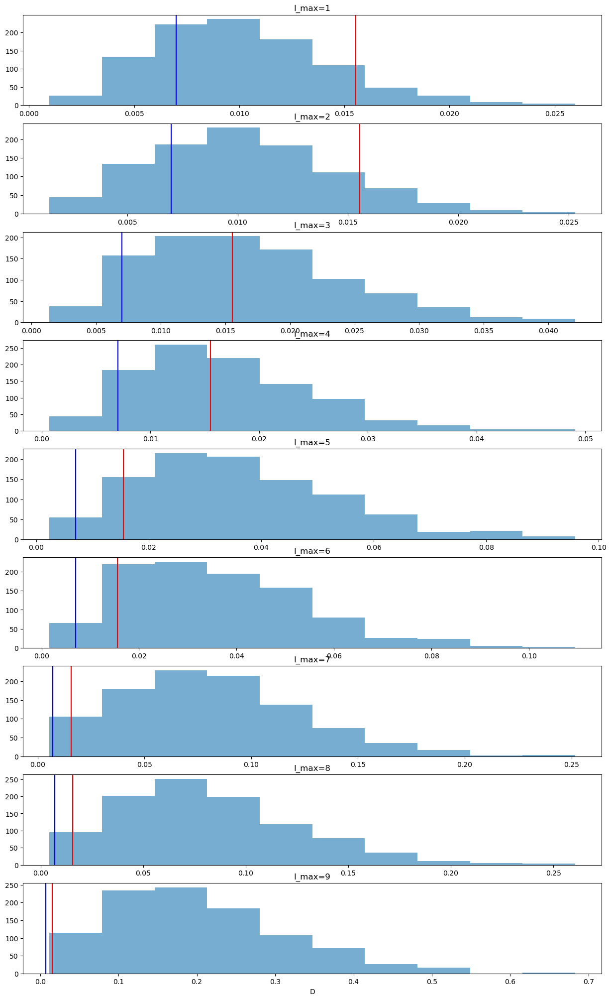

In [253]:
import random 
nside = 64
lmax = 3*nside -1
fig , ax = plt.subplots (9, 1 , figsize = (15,25))
for l_f in range (2,11):
    print(l_f)
    N_t = 1000
    #l_f = 4
    D_arr = np.zeros (N_t)
    dip_out = np.zeros (N_t)
    dip_sol = np.zeros (N_t)
    tmp_cl = np.zeros(lmax+1)
    tmp_cl[0] = 1
    tmp_cl[1] = 5.444e-6
    tmp_cl[2:15] = 5.444e-6
    
    mono_out = np.zeros (N_t)

    for i in range (N_t):

        tmp_alm = hp.synalm(tmp_cl)
        tmp_cl_norm = hp.alm2cl(tmp_alm)
        #print (tmp_cl_norm)
        
        for l in range (l_f):
            
            for m in range (0,15+1):
                ind = hp.Alm.getidx(lmax, l, m)
                tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
        #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
        #print (tmp_alm)

        tmp_map = hp.alm2map(tmp_alm, nside)
        #print (tmp_map)
        #tmp_map = np.abs (tmp_map)
        #quas_map = point_picking_old(tmp_map,100000)

        #quas_map = np.copy (quas_map)

        tmp_masked = hp.ma (tmp_map)
        tmp_masked.mask = np.logical_not(quasar_mask)
        cl_sol = hp.anafast(tmp_map)
        dip_sol[i] = cl_sol[1]

        #tmp_fitted = hp.fit_dipole(tmp_masked)
        #cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))

        cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
        #alm.append (fit_alm(tmp_masked,1))
        dip_out[i] = cl_out[1]
        mono_out[i] = cl_out[0]
        D_arr[i] = 3*np.sqrt(cl_out[1]/cl_out[0])
    

    ax[l_f-2].hist (3*np.sqrt(dip_out/mono_out) , alpha = 0.6)
    #ax[l_f-2].legend()
    ax[l_f-2].set_title('l_max='+str(l_f-1))
    ax[l_f-2].axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "")
    ax[l_f-2].axvline(x = 0.01554, color = 'r', label = "")
    #ax[l_f-1].set_xlabel ("D")
    #plt.legend ("l_max = %d")
    #plt.hist (dip_sol, alpha = 1, color = 'black')
ax[-1].set_xlabel ("D")

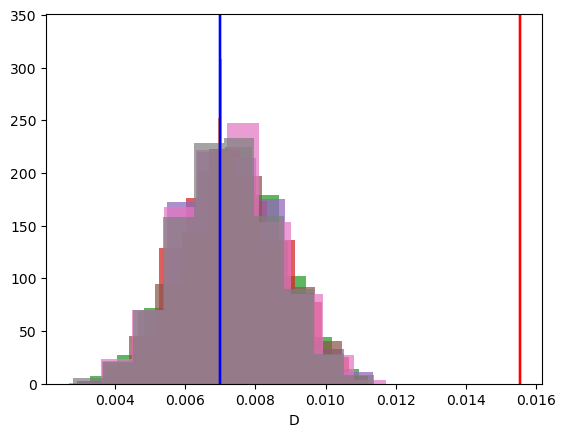

In [209]:
nside = 64
lmax = 3*nside -1
for l_f in range (2,10):
    import random 
    N_t = 1000
    #l_f = 4
    D_arr = np.zeros (N_t)
    dip_out = np.zeros (N_t)
    dip_sol = np.zeros (N_t)
    tmp_cl = np.zeros(lmax+1)
    tmp_cl[0] = 1
    tmp_cl[1] = 5.444e-6
    tmp_cl[2:l_f] = 5.444e-7
    mono_out = np.zeros (N_t)

    for i in range (N_t):

        tmp_alm = hp.synalm(tmp_cl)
        tmp_cl_norm = hp.alm2cl(tmp_alm)
        #print (tmp_cl_norm)
        for l in range (l_f):
            for m in range (0,l+1):
                ind = hp.Alm.getidx(lmax, l, m)
                tmp_alm[ind]=tmp_alm[ind]/np.sqrt(tmp_cl_norm[l]) * np.sqrt (tmp_cl[l])
        #sim_qsr_tmp_map = point_picking_old(weighting=tmp_map, points=100000) 
        #print (tmp_alm)

        tmp_map = hp.alm2map(tmp_alm, nside)
        #print (tmp_map)
        #tmp_map = np.abs (tmp_map)
        #quas_map = point_picking_old(tmp_map,100000)

        #quas_map = np.copy (quas_map)

        tmp_masked = hp.ma (tmp_map)
        tmp_masked.mask = np.logical_not(quasar_mask)
        cl_sol = hp.anafast(tmp_map)
        dip_sol[i] = cl_sol[1]

        tmp_fitted = hp.fit_dipole(tmp_masked)
        cl_out =  hp.alm2cl(dipole2alm(tmp_fitted,1))

        #cl_out = hp.alm2cl (fit_alm(tmp_masked,l_f-1))
        #alm.append (fit_alm(tmp_masked,1))
        dip_out[i] = cl_out[1]
        mono_out[i] = cl_out[0]
        D_arr[i] = 3*np.sqrt(cl_out[1]/cl_out[0])
    plt.axvline(x = 3*np.sqrt(tmp_cl[1]/tmp_cl[0]), color = 'b', label = "input dipole")
    plt.axvline(x = 0.01554, color = 'r', label = "")

    plt.hist (3*np.sqrt(dip_out/mono_out),   alpha= 0.8-l_f*0.01)
    plt.xlabel ("D")
    #plt.hist (dip_sol, alpha = 1, color = 'black')


In [440]:
alm2dipole(dipole2alm(np.array([1,[0,1,1]]),1),1)

<ipython-input-440-87ecdf32a06f>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  alm2dipole(dipole2alm(np.array([1,[0,1,1]]),1),1)


((0.9999999999999999+0j), array([-0.+0.j,  1.+0.j,  1.+0.j]))

In [446]:
alm2dipole(fit_alm(ma_masked,1),1)

((-0.001543730791325846-0.0075237836679309415j),
 array([1.02400261-0.j        , 0.01609727+0.j        ,
        0.00219142+0.00703343j]))

In [403]:
hp.fit_dipole(ma)

(-1.232595164407831e-32,
 array([1.00000000e+00, 0.00000000e+00, 6.71667241e-36]))

In [402]:
hp.fit_dipole(ma_masked)

(0.0, array([1.00000000e+00, 3.46944695e-18, 4.33680869e-19]))

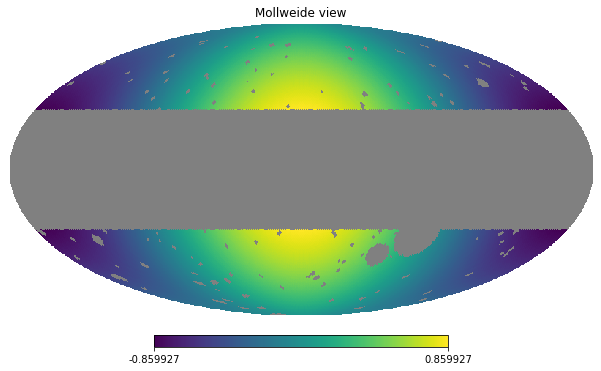

In [401]:
hp.mollview(ma_masked)

# Finding the covariance matrix for a masked map

In [21]:
nside = 8 
Map = masked_cl_map1[masked_cl_map1!=UNSEEN]

NameError: name 'masked_cl_map1' is not defined

In [106]:
theta_arr = []
phi_arr =[]
area = hp.nside2pixarea(nside,degrees=False)
unmasked_pix = []
for ind , value in enumerate(Map):
    #print (value)
    if value != UNSEEN:
        thet, ph = hp.pix2ang(nside, ind)
        theta_arr.append(thet)
        phi_arr.append(ph)
        unmasked_pix.append(ind)

In [107]:
psudo_alm = np.zeros(almsize , dtype = np.complex128)

In [108]:
for l in range(lmax+1):
    for m in range (0,l+1):
        #print (l,m)
        i = hp.Alm.getidx(lmax,l,m)
        psudo_alm[i] = area*np.sum(Map[unmasked_pix]*sp.sph_harm(m, l, phi_arr, theta_arr ))

In [109]:
psudo_alm[np.isnan(psudo_alm)==True] =0

In [567]:
area

0.016362461737446838

In [568]:
Ylm = []

In [569]:
for i in range (almsize):
    l,m = hp.Alm.getlm(lmax,i)
    Ylm.append (sp.sph_harm(m, l, phi_arr, theta_arr ))


In [570]:
Ylm

[array([0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j,
        0.28209479+0.j, 0.28209479+0.j, 0.28209479+0.j, 0.282094

In [571]:
I_arr = np.zeros ((almsize, almsize), dtype = np.complex128)
#for l in range(lmax+1):
#    for m in range (0,l+1):
#        for lp in range(lmax+1):
#            for mp in range (lp+1):
                #print (l,m)
for i in range (almsize):
    for j in range (i,almsize):
       # i = hp.Alm.getidx(lmax,l,m)
       # j = hp.Alm.getidx(lmax,lp,mp)
        #print (i,j)
        I_arr[i,j] = area*np.sum(Ylm[i]*np.conj(Ylm[j]))
        I_arr[j,i] = area*np.sum(Ylm[j]*np.conj(Ylm[i]))

In [864]:
#I_arr = I_arr.T
Y = psudo_alm
I_star = I_arr.conj().T
alm1 = np.linalg.inv(I_star @ I_arr) @ I_star @ Y



In [573]:
psudo_alm

array([ 1.03496985e+00+0.00000000e+00j, -6.99938442e-02+0.00000000e+00j,
        8.33058527e-01+0.00000000e+00j, -1.31763786e+00+0.00000000e+00j,
       -2.54670945e-01+0.00000000e+00j, -9.72340253e-01+0.00000000e+00j,
       -2.18087038e-01+0.00000000e+00j,  6.47342004e-01+0.00000000e+00j,
       -2.56562586e-01+0.00000000e+00j,  2.79797469e-01+0.00000000e+00j,
        3.91489925e-01+0.00000000e+00j, -1.21318338e+00+0.00000000e+00j,
        7.40468144e-01+0.00000000e+00j, -1.00201301e+00+0.00000000e+00j,
       -8.22145541e-01+0.00000000e+00j, -8.97029242e-02+0.00000000e+00j,
       -7.60494284e-01+0.00000000e+00j, -1.93081504e-02+0.00000000e+00j,
        1.09789944e+00+0.00000000e+00j,  2.12851911e-01+0.00000000e+00j,
        5.81130589e-01+0.00000000e+00j,  6.56846803e-01+0.00000000e+00j,
       -4.66821690e-01+0.00000000e+00j,  3.49856764e-01+0.00000000e+00j,
       -3.46408537e-01+2.32241384e-01j,  1.34550941e+00+5.75820569e-01j,
       -9.42508145e-01-1.76279242e-02j, -2.14953067

In [574]:
alm@I_arr

array([ 2.83828699e+00+8.00964596e-01j,  2.56701574e-01-6.37513303e-01j,
       -6.70994317e-01-4.61015184e-01j, -1.39959301e+00+1.14023026e+00j,
        7.07229266e-01-3.40806240e-01j, -8.35035283e-01-5.94634714e-01j,
        3.12851578e+00+9.73801868e-01j,  1.48209425e-01-2.27091743e-01j,
       -4.95352064e+00-1.01062945e+00j, -3.86856798e-01+1.05344770e+00j,
        2.63813143e+00+4.30925683e-01j, -8.75671673e-01-1.12060722e+00j,
        3.13793995e+00+5.16447963e-01j, -1.70280032e+00+5.20601945e-01j,
       -6.29551487e+00-1.32131155e+00j, -7.37653242e-01+7.05162810e-01j,
        5.15035045e+00+1.70276116e+00j,  1.33355320e+00-1.66074957e+00j,
       -4.22593712e+00-1.53484181e+00j,  2.49393823e-01+2.16758000e+00j,
        3.95574226e+00+9.85805312e-01j,  5.74128615e-01-1.78729818e+00j,
       -2.05565734e+00-3.98650075e-01j, -1.71046197e-02+1.01827338e+00j,
       -3.52369410e+01-4.66881583e+01j, -2.98358834e+00-3.09688104e+00j,
        4.96154478e+00+8.47231853e+00j,  1.83434716

In [575]:
alm

array([-1.93023798e+13-6.01414749e+12j, -3.01276039e+13+1.24578610e+14j,
        2.40787477e+13+7.50914416e+12j,  5.81825443e+13-2.42062304e+14j,
       -2.87678218e+13-8.98329857e+12j, -6.55040292e+13+2.76401397e+14j,
        3.28775491e+13+1.02776488e+13j,  5.13593978e+13-2.23960882e+14j,
       -3.40931784e+13-1.06654788e+13j, -2.39632846e+13+1.16680029e+14j,
        3.13012507e+13+9.79677469e+12j, -4.44523765e+12-2.84641709e+12j,
       -2.50694563e+13-7.84876810e+12j,  2.36092083e+13-7.65219145e+13j,
        1.72279369e+13+5.39482930e+12j, -2.94874282e+13+1.04478344e+14j,
       -9.88805062e+12-3.09675230e+12j,  2.45137817e+13-8.95036425e+13j,
        4.51586159e+12+1.41434940e+12j, -1.48305554e+13+5.49441059e+13j,
       -1.48492963e+12-4.65057826e+11j,  6.19142778e+12-2.31265724e+13j,
        2.71545338e+11+8.50121148e+10j, -1.42261679e+12+5.34027859e+12j,
        5.60868949e+11+1.02362160e+12j,  8.87215229e+10+4.75592497e+10j,
       -2.64334638e+12-4.88581371e+12j, -1.40650693

In [576]:
hp.map2alm(map_cl)

array([ 1.11342356e+00+0.00000000e+00j,  1.09148414e-01+0.00000000e+00j,
        1.00826260e+00+0.00000000e+00j, -1.65427727e+00+0.00000000e+00j,
       -7.83966249e-01+0.00000000e+00j, -8.13960700e-01+0.00000000e+00j,
        6.64017260e-01+0.00000000e+00j,  7.70123802e-01+0.00000000e+00j,
       -1.09025930e+00+0.00000000e+00j, -3.15977089e-01+0.00000000e+00j,
        1.02535019e+00+0.00000000e+00j, -4.60671886e-01+0.00000000e+00j,
        5.72740026e-01+0.00000000e+00j, -1.81900213e+00+0.00000000e+00j,
       -8.59557730e-01+0.00000000e+00j,  3.69475699e-01+0.00000000e+00j,
       -5.95320678e-01+0.00000000e+00j, -2.52558497e-01+0.00000000e+00j,
        1.22316596e+00+0.00000000e+00j,  4.83033501e-02+0.00000000e+00j,
        3.17303719e-01+0.00000000e+00j,  8.46537670e-01+0.00000000e+00j,
       -2.12562601e-02+0.00000000e+00j,  4.17601820e-02+0.00000000e+00j,
        2.70707462e-01-5.92205536e-02j,  1.76153637e+00-9.17017961e-01j,
       -1.23038665e+00+3.10634503e-02j, -5.95279337

In [580]:
fit_alm(masked_cl_map1,22)

array([ 1.84695506e+09-6.72009897e+08j,  1.10837710e+08-1.32494990e+08j,
       -1.71015975e+09+6.35741946e+08j, -2.28291790e+08+2.72899159e+08j,
        1.01143192e+09-4.07605786e+08j,  2.94454980e+08-3.51990395e+08j,
       -1.91624966e+08+1.36908058e+08j, -3.00788655e+08+3.59561645e+08j,
       -4.89169268e+08+9.26694286e+07j,  2.57936235e+08-3.08336020e+08j,
        8.67693813e+08-2.27861847e+08j, -1.88520252e+08+2.25356409e+08j,
       -9.19188221e+08+2.58987828e+08j,  1.16813577e+08-1.39638518e+08j,
        7.37087730e+08-2.13936104e+08j, -5.99626047e+07+7.16790750e+07j,
       -4.65331517e+08+1.37210607e+08j,  2.42952473e+07-2.90424482e+07j,
        2.26220819e+08-6.73387653e+07j, -7.02132829e+06+8.39326949e+06j,
       -7.75948630e+07+2.32369559e+07j,  1.11073169e+06-1.32776339e+06j,
        1.46053306e+07-4.39116849e+06j,  1.01242685e+10+4.76400567e+09j,
       -7.05894909e+08-3.84929859e+09j, -8.43367672e+09-3.96849252e+09j,
        1.11905836e+09+6.10231026e+09j,  6.76218475

# Another approach

In [24]:
from sympy.physics.quantum.cg import CG
from sympy import S

In [25]:
nside = 64
lmax  =3*nside-1
mapsize = hp.nside2npix(nside)
theta, phi = hp.pix2ang (nside, np.arange(0,mapsize))
ids = np.where (np.abs(theta-np.pi/2) < 30/180*np.pi )[0]


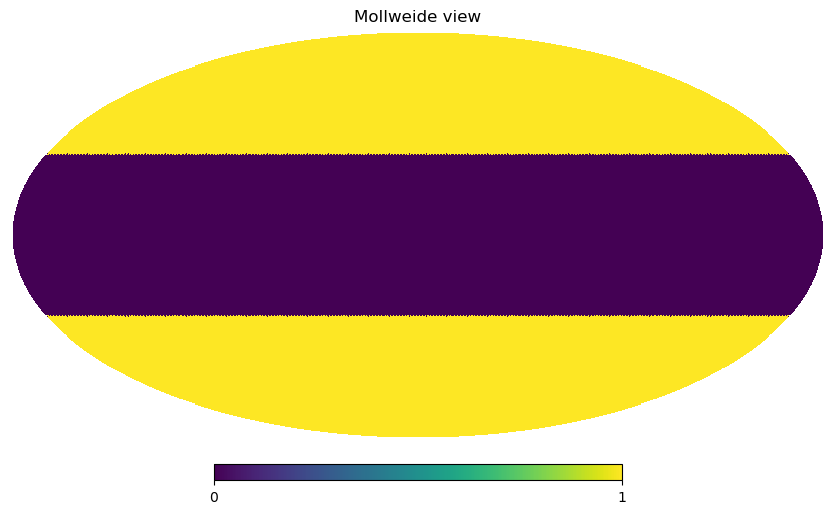

In [26]:
masked_pix = hp.ang2pix (nside, theta[ids] , phi[ids])
mask = np.ones (mapsize)
mask [masked_pix] = 0
hp.mollview(mask)


In [39]:
alm_mask = hp.map2alm(mask, lmax=lmax)

In [28]:
np.where (alm_mask>0.001)

(array([  0,   2,   8,  14,  20,  26,  32,  38,  44,  48,  50,  54,  56,
         60,  62,  66,  68,  72,  74,  78,  80,  84,  86,  90,  92,  96,
         98, 102, 104, 108, 110, 114, 116, 120, 122, 126, 128, 132, 134,
        138, 140, 144, 146, 150, 152, 156, 158, 162, 164, 168, 170, 174,
        176, 180, 182, 186, 188]),)

In [29]:
cl_alm = hp.map2alm(map_cl)

NameError: name 'map_cl' is not defined

In [30]:
mskd_cl_map = mask*map_cl
hp.mollview(mskd_cl_map)
mskd_cl_alm = hp.map2alm(mskd_cl_map)

NameError: name 'map_cl' is not defined

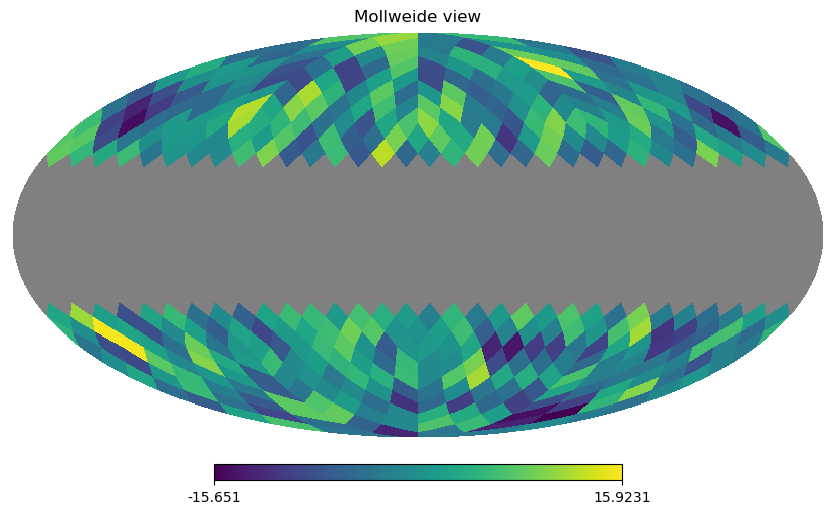

In [238]:

masked_cl_map1 = hp.ma (map_cl)
masked_cl_map1.mask = np.logical_not(mask)
hp.mollview (masked_cl_map1)

In [34]:
Q =Q_mat(20)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230


In [626]:

#######

Q = np.zeros ((almsize,almsize,almsize),dtype = np.complex128)
for I in range (95,almsize):
    print(I)
    for i in range (almsize):
        for j in range (i,almsize):
            #print (I)
            L,M = hp.Alm.getlm(lmax,I)
            l1,m1 = hp.Alm.getlm(lmax,i)
            l2,m2 = hp.Alm.getlm(lmax,j)
            fac = np.sqrt ((2*l1+1)*(2*l2+1)/(4*np.pi)/(2*L+1))
            Q[I,i,j] = fac*CG(l1,0,l2,0,L,0).doit()*CG(l1,m1,l2,m2,L,M).doit()
            Q[I,j,i] = Q[I,i,j]
            
######

95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
282
283
284
285
286
287
288
289
290
291
292
293
294
295
296
297
298
299


In [38]:
Q.shape

(231, 231, 231)

In [36]:
lmax = 20

In [40]:
almsize = hp.Alm.getsize(lmax)
AA = np.zeros ((almsize,almsize), dtype = np.complex128)
for k in range(almsize):
    AA[k,:] = alm_mask@Q[k,:,:]
#AA = AA.T

In [41]:
eigvals , eigvecs = np.linalg.eig(AA)

In [42]:
Y = mskd_cl_alm
AA_star = AA.conj().T
alm =  np.linalg.inv(AA_star @ AA) @ AA_star @ Y

NameError: name 'mskd_cl_alm' is not defined

/Users/arefe/opt/anaconda3/envs/envhealpy/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


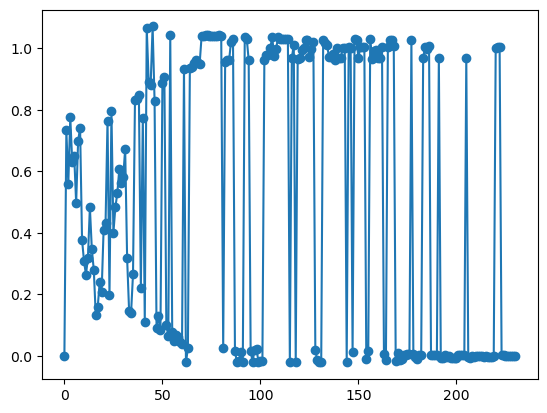

In [43]:
plt.plot (np.arange(len(eigvals)), eigvals, '-o')

In [243]:
np.linalg.cond(AA)

12836.274652979819

In [244]:
np.linalg.det(AA)

(6.499569833677105e-257+0j)

In [264]:
Q[0,-1,:]

array([0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
       0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j, 0.+0.j,
      

Text(0, 0.5, 'a_lm')

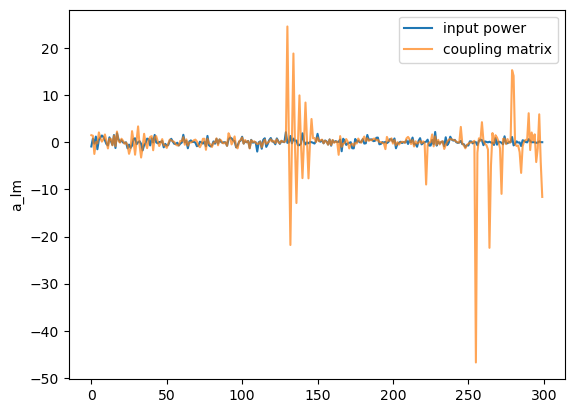

In [245]:
#plt.plot (np.arange (almsize), alm, alpha = 0.5)
plt.plot (np.arange (almsize), cl_alm)
plt.plot (np.arange (almsize), alm, alpha = 0.7)
#plt.plot (np.arange (almsize), fit_alm(mskd_cl_map,lmax), alpha = 0.4)
plt.legend(["input power","coupling matrix","linear regression"])
#plt.yscale ("log")
plt.ylabel("a_lm")

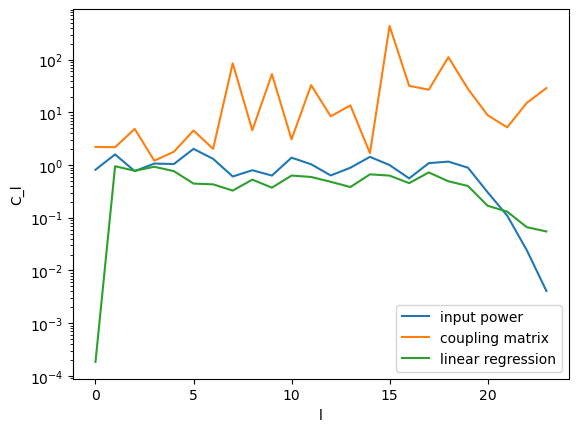

In [142]:
plt.plot (np.arange (lmax+1), hp.alm2cl(cl_alm))
plt.plot (np.arange (lmax+1), hp.alm2cl(alm))

#plt.plot (np.arange (lmax+1), hp.alm2cl(alm1)/1e26)
plt.plot (np.arange (lmax+1), hp.alm2cl(fit_alm(mskd_cl_map,lmax)))
plt.legend(["input power","coupling matrix","linear regression"])
plt.ylabel("C_l")
plt.xlabel("l")
plt.yscale("log")

In [176]:
hp.alm2cl(alm)[11]

2.208613893657367

In [175]:
hp.alm2cl(cl_alm)[11]

0.5991078011551345

In [140]:
np.save('data.npy', Q)

In [143]:
data = np.load('data.npy')

/Users/arefe/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/Users/arefe/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/Users/arefe/opt/anaconda3/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1317: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


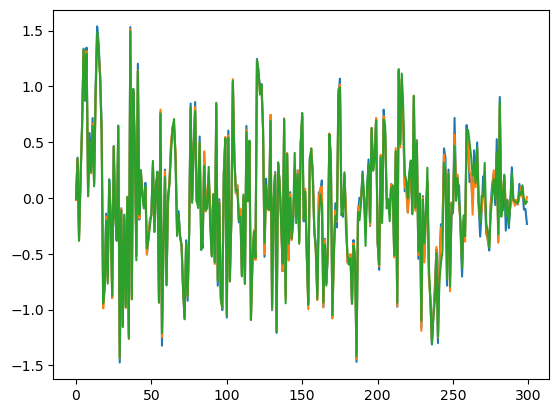

In [132]:
plt.plot (np.arange (almsize), AA@alm)
plt.plot (np.arange (almsize), AA@cl_alm)
plt.plot (np.arange (almsize), AA@fit_alm(mskd_cl_map,lmax))

In [892]:
alm

array([ 1.53597174e+00+0.00000000e+00j,  1.15338804e-01+0.00000000e+00j,
        5.42925058e-01+0.00000000e+00j, -1.67107118e+00+0.00000000e+00j,
       -3.25846558e-01+0.00000000e+00j, -8.03409305e-01+0.00000000e+00j,
        2.16935898e-01+0.00000000e+00j,  7.55736942e-01+0.00000000e+00j,
       -6.75330576e-01+0.00000000e+00j, -3.03976770e-01+0.00000000e+00j,
        6.47711521e-01+0.00000000e+00j, -4.78159246e-01+0.00000000e+00j,
        9.17512202e-01+0.00000000e+00j, -1.77999188e+00+0.00000000e+00j,
       -1.18206377e+00+0.00000000e+00j,  3.24026239e-01+0.00000000e+00j,
       -3.17124287e-01+0.00000000e+00j, -1.94704921e-01+0.00000000e+00j,
        9.82556666e-01+0.00000000e+00j, -2.76251624e-02+0.00000000e+00j,
        5.00274917e-01+0.00000000e+00j,  9.46577700e-01+0.00000000e+00j,
       -1.64522384e-01+0.00000000e+00j, -5.03419632e-02+0.00000000e+00j,
        6.19424353e-01+4.14761223e-02j,  1.75634299e+00-9.18165232e-01j,
       -1.55033207e+00-6.20348512e-02j, -5.86191787

In [893]:
cl_alm

array([ 1.11342356e+00+0.00000000e+00j,  1.09148414e-01+0.00000000e+00j,
        1.00826260e+00+0.00000000e+00j, -1.65427727e+00+0.00000000e+00j,
       -7.83966249e-01+0.00000000e+00j, -8.13960700e-01+0.00000000e+00j,
        6.64017260e-01+0.00000000e+00j,  7.70123802e-01+0.00000000e+00j,
       -1.09025930e+00+0.00000000e+00j, -3.15977089e-01+0.00000000e+00j,
        1.02535019e+00+0.00000000e+00j, -4.60671886e-01+0.00000000e+00j,
        5.72740026e-01+0.00000000e+00j, -1.81900213e+00+0.00000000e+00j,
       -8.59557730e-01+0.00000000e+00j,  3.69475699e-01+0.00000000e+00j,
       -5.95320678e-01+0.00000000e+00j, -2.52558497e-01+0.00000000e+00j,
        1.22316596e+00+0.00000000e+00j,  4.83033501e-02+0.00000000e+00j,
        3.17303719e-01+0.00000000e+00j,  8.46537670e-01+0.00000000e+00j,
       -2.12562601e-02+0.00000000e+00j,  4.17601820e-02+0.00000000e+00j,
        2.70707462e-01-5.92205536e-02j,  1.76153637e+00-9.17017961e-01j,
       -1.23038665e+00+3.10634503e-02j, -5.95279337

In [724]:
AA@alm

array([ 1.59796228e+00+1.33629494e-28j,  1.85054456e+00+5.47043453e-28j,
        9.42897486e-01-7.61574330e-29j,  3.54025850e-01-1.50034842e-27j,
       -9.33928786e-01-2.97132472e-28j, -3.51801879e-01-3.82060782e-28j,
        1.08730238e-01+5.29388068e-29j,  1.98156609e-01+9.52194209e-28j,
        3.64332819e-01+1.62328450e-28j, -6.06990436e-03-6.54099735e-28j,
       -4.09378873e-01+3.76080192e-29j, -1.29292321e-01+2.58040331e-28j,
        1.25487133e-01+1.50176024e-28j,  1.32178745e-01-2.01811699e-29j,
        1.61220898e-01-2.22905206e-29j, -4.86112273e-02-4.30177446e-28j,
       -2.83373024e-01+1.93801997e-29j, -6.15639761e-02+7.60326905e-28j,
        1.43329363e-01-2.72935666e-28j,  9.82393191e-02-1.31962622e-28j,
        5.92469090e-02+2.34801964e-28j, -6.61365467e-02+6.96600194e-29j,
       -2.17628711e-01-4.14812569e-29j, -2.26813880e-02-4.03510538e-28j,
       -5.21532972e-01+5.21532972e-01j, -5.11883460e-01+1.14601173e-16j,
       -5.83085546e-01+5.83085546e-01j, -1.78789009

In [675]:
lmax

23

In [729]:
tt= np.array([[[1,2,0],[2,0,0],[0,0,1]],[[1,0,3],[0,-1,0],[3,0,0]],[[1,1,2],[1,0,0],[2,0,1]]])

In [732]:
T = np.zeros((3,3))
for n in range (3):
    T[:,n] = tt[n,:,:]@np.array([1,2,3])

In [733]:
T

array([[ 5., 10.,  9.],
       [ 2., -2.,  1.],
       [ 3.,  3.,  5.]])

In [742]:
(AA==AA.T).all()

False

In [725]:
AA@sum_alm

array([ 1.59845197e+00-3.04928598e-18j,  1.84934077e+00-1.89359034e-18j,
        9.44168068e-01-3.19394793e-18j,  3.51704170e-01-1.88724357e-19j,
       -9.32047731e-01+2.81760880e-18j, -3.54738168e-01+1.79429211e-18j,
        1.10835891e-01+4.26845300e-18j,  1.95157572e-01+9.41089623e-19j,
        3.66648807e-01-4.22744942e-19j, -9.63525776e-03-9.56948851e-19j,
       -4.06461453e-01-2.96641112e-18j, -1.33779811e-01-1.07317569e-18j,
        1.28803253e-01-1.41469548e-18j,  1.27568187e-01+2.14865148e-19j,
        1.64444735e-01+1.18718303e-18j, -5.30765999e-02+5.70150541e-19j,
       -2.79669642e-01-2.01703287e-20j, -6.71675898e-02-2.93395564e-19j,
        1.48102372e-01-1.50247376e-18j,  9.12778251e-02-2.35602599e-19j,
        6.39245876e-02+1.60549496e-18j, -7.22109696e-02+5.77604282e-19j,
       -1.86193448e-01+2.16716553e-18j, -1.00786904e-01+1.07891763e-19j,
       -5.21524338e-01+5.21524338e-01j, -5.11990458e-01+7.74068611e-17j,
       -5.83054464e-01+5.83054464e-01j, -1.78797330

array([ 2.62865037e+00+0.00000000e+00j,  2.02840248e+00+0.00000000e+00j,
        1.85839903e-01+0.00000000e+00j,  3.82702963e-02+0.00000000e+00j,
       -8.95928064e-01+0.00000000e+00j, -5.79508705e-02+0.00000000e+00j,
        7.48660962e-01+0.00000000e+00j,  6.84195900e-02+0.00000000e+00j,
       -5.87048785e-01+0.00000000e+00j, -7.69486590e-02+0.00000000e+00j,
        3.90046231e-01+0.00000000e+00j,  7.37487531e-02+0.00000000e+00j,
       -2.18363039e-01+0.00000000e+00j, -6.96448787e-02+0.00000000e+00j,
        3.60794931e-02+0.00000000e+00j,  5.43604461e-02+0.00000000e+00j,
        8.85385764e-02+0.00000000e+00j, -4.10139839e-02+0.00000000e+00j,
       -2.03205728e-01+0.00000000e+00j,  1.88528315e-02+0.00000000e+00j,
        2.33691444e-01+0.00000000e+00j, -3.93719977e-03+0.00000000e+00j,
       -2.57894723e-01+0.00000000e+00j, -1.58275980e-02+0.00000000e+00j,
       -1.00136388e+00+1.00136388e+00j, -6.33499874e-01+1.40102455e-16j,
       -3.88650116e-01+3.88650116e-01j, -2.37982477

In [825]:
l = lmax
QQ = Q_mat(l)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [826]:
A = np.zeros ((hp.Alm.getsize(l),hp.Alm.getsize(l)), dtype = np.complex128)
for k in range(hp.Alm.getsize(l)):
    A[k,:] = hp.map2alm(mask, lmax=l)@QQ[k,:,:]
#AA = AA.T


Y = hp.map2alm(mskd_cl_map, lmax=l)
A_star = A.conj().T
almm =  np.linalg.inv(A_star @ A) @ A_star @ Y

In [827]:
A@almm

array([ 1.04805225e+00-3.42881121e-10j, -8.79412375e-02+2.29147941e-10j,
        8.54682846e-01+3.59192594e-10j, -1.33415513e+00-4.62323631e-10j,
       -2.34110790e-01-3.20262445e-10j, -9.92373680e-01+5.56985879e-10j,
       -1.88178056e-01+2.69283295e-10j,  6.12763659e-01-5.37234873e-10j,
       -2.15541716e-01-2.22855628e-10j,  2.40091021e-01+4.30858270e-10j,
        4.27744700e-01+1.88757196e-10j, -1.24661698e+00-3.26742171e-10j,
        7.70353197e-01-1.64715012e-10j, -1.04181466e+00+2.67484236e-10j,
       -7.78727454e-01+1.44189380e-10j, -1.46923460e-01-2.67529676e-10j,
       -7.06657222e-01-1.19526896e-10j, -7.48330114e-02+2.87981067e-10j,
        1.13269860e+00+8.85698168e-11j,  1.71766518e-01-2.91730693e-10j,
        6.09412796e-01-5.42018320e-11j,  6.02308852e-01+2.45737238e-10j,
       -3.99384210e-01+2.34899214e-11j,  2.69780573e-01-1.64339928e-10j,
       -3.47552996e-01-2.29729645e-01j,  1.34272909e+00-5.70758852e-01j,
       -9.45732383e-01+1.98182674e-02j, -1.60888399

In [828]:
A@hp.map2alm(map_cl,lmax=l )

array([ 1.04244956e+00+0.00000000e+00j, -8.47122250e-02+0.00000000e+00j,
        8.46816685e-01+0.00000000e+00j, -1.35921292e+00+0.00000000e+00j,
       -2.51030547e-01+0.00000000e+00j, -1.00183585e+00+0.00000000e+00j,
       -2.45636829e-01+0.00000000e+00j,  6.49477063e-01+0.00000000e+00j,
       -2.23938328e-01+0.00000000e+00j,  2.19775104e-01+0.00000000e+00j,
        4.73374496e-01+0.00000000e+00j, -1.19086967e+00+0.00000000e+00j,
        7.06125990e-01+0.00000000e+00j, -9.48440943e-01+0.00000000e+00j,
       -8.34348195e-01+0.00000000e+00j, -1.85577097e-01+0.00000000e+00j,
       -6.42974827e-01+0.00000000e+00j, -3.72324284e-02+0.00000000e+00j,
        1.08520389e+00+0.00000000e+00j,  2.43480646e-01+0.00000000e+00j,
        5.78698542e-01+0.00000000e+00j,  6.45315946e-01+0.00000000e+00j,
       -3.41422460e-01+0.00000000e+00j,  3.37639214e-01+0.00000000e+00j,
       -3.47277882e-01-2.30732154e-01j,  1.33960785e+00-5.72233972e-01j,
       -9.47933137e-01+1.62812165e-02j, -1.88543473

In [829]:
almm

array([ 3.50823513e+00+1.94220268e-07j, -1.10689939e+00-1.11738319e-07j,
       -1.36003902e+00-2.05934190e-07j,  7.35209681e-01+2.27089639e-07j,
        1.01749830e+00+1.83858988e-07j, -3.52121434e+00-2.80587913e-07j,
       -3.61475811e-01-1.55091043e-07j,  3.01838631e+00+2.75479628e-07j,
       -5.83915960e-01+1.26558899e-07j, -1.74040489e+00-2.32329043e-07j,
        8.11267318e-01-1.02406522e-07j,  1.59285164e-01+1.87356715e-07j,
        7.44537363e-01+8.30047601e-08j, -2.24229889e+00-1.59883658e-07j,
       -1.01191794e+00-6.66559890e-08j,  8.35940369e-01+1.56201518e-07j,
       -3.20642763e-01+5.09596704e-08j, -1.05584097e+00-1.58918709e-07j,
        8.81956408e-01-3.51761381e-08j,  1.00160683e+00+1.52795137e-07j,
        6.84814373e-01+2.00904731e-08j, -2.12329585e-01-1.24307205e-07j,
       -2.81818244e-01-7.84004877e-09j,  7.00776398e-01+8.07533621e-08j,
       -3.22227361e-01+1.04527156e+00j, -1.03801804e-01+9.04558851e-02j,
       -9.53517653e-01-8.30958998e-01j,  2.29708949

In [830]:
cl_alm

array([ 1.11342356e+00+0.00000000e+00j,  1.09148414e-01+0.00000000e+00j,
        1.00826260e+00+0.00000000e+00j, -1.65427727e+00+0.00000000e+00j,
       -7.83966249e-01+0.00000000e+00j, -8.13960700e-01+0.00000000e+00j,
        6.64017260e-01+0.00000000e+00j,  7.70123802e-01+0.00000000e+00j,
       -1.09025930e+00+0.00000000e+00j, -3.15977089e-01+0.00000000e+00j,
        1.02535019e+00+0.00000000e+00j, -4.60671886e-01+0.00000000e+00j,
        5.72740026e-01+0.00000000e+00j, -1.81900213e+00+0.00000000e+00j,
       -8.59557730e-01+0.00000000e+00j,  3.69475699e-01+0.00000000e+00j,
       -5.95320678e-01+0.00000000e+00j, -2.52558497e-01+0.00000000e+00j,
        1.22316596e+00+0.00000000e+00j,  4.83033501e-02+0.00000000e+00j,
        3.17303719e-01+0.00000000e+00j,  8.46537670e-01+0.00000000e+00j,
       -2.12562601e-02+0.00000000e+00j,  4.17601820e-02+0.00000000e+00j,
        2.70707462e-01-5.92205536e-02j,  1.76153637e+00-9.17017961e-01j,
       -1.23038665e+00+3.10634503e-02j, -5.95279337

In [831]:
QQ == Q

array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  Tr

In [152]:
G = np.array ([[0.01,2.01,0.01],[3.01,0.01,0.01],[1.01,1.01,0.01]])

In [183]:
X = np.array([2.03,3.03,2.08]).reshape(3,1)

In [184]:
correct_ans = np.array([1,1,1]).reshape(3,1)

In [185]:
ans = np.linalg.inv(G)@X
ans 

array([[ 0.9 ],
       [ 0.85],
       [31.25]])

In [179]:
G@np.array([1,1,1])

array([2.03, 3.03, 2.03])

In [157]:
G@ans

array([[2.],
       [3.],
       [2.]])

In [158]:
1/np.linalg.det(G)

-100.00000000000006

In [175]:
Adj = np.linalg.inv(G).T*np.linalg.det(G)
Adj

array([[-0.01, -0.02,  3.03],
       [-0.01, -0.01,  2.02],
       [ 0.02,  0.03, -6.05]])

In [ ]:
# 1/np.linalg.det(G)*np.array([[-0.0001, -0.0301,  0.0202],
                            [-0.0402, -0.0001,  0.0303],
                               [0.0303,  0.0202, -6.05]])@[2.03,3.03,2.03]

In [170]:
np.linalg.inv(G)

array([[   1.,    1.,   -2.],
       [   2.,    1.,   -3.],
       [-303., -202.,  605.]])

In [214]:
G = np.array ([[1.01,0.01,2],[2,0,4.001],[1.002,1,3]])

In [215]:
X = np.array([3,6,5]).reshape(3,1)

In [216]:
correct_ans = np.array([1,1,1]).reshape(3,1)

In [217]:
ans = np.linalg.inv(G)@X
ans 

array([[-0.27987534],
       [ 0.36185173],
       [ 1.63952779]])

In [202]:
G@np.array([1,1,1])

array([3.02, 6.  , 5.  ])

In [203]:
G@ans

array([[3.],
       [6.],
       [5.]])

In [158]:
1/np.linalg.det(G)

-100.00000000000006

In [175]:
Adj = np.linalg.inv(G).T*np.linalg.det(G)
Adj

array([[-0.01, -0.02,  3.03],
       [-0.01, -0.01,  2.02],
       [ 0.02,  0.03, -6.05]])

# 1/np.linalg.det(G)*np.array([[-0.0001, -0.0301,  0.0202],
                            [-0.0402, -0.0001,  0.0303],
                               [0.0303,  0.0202, -6.05]])@[2.03,3.03,2.03]

In [170]:
np.linalg.inv(G)

array([[   1.,    1.,   -2.],
       [   2.,    1.,   -3.],
       [-303., -202.,  605.]])